<a href="https://colab.research.google.com/github/christinaxliu/research/blob/main/Caltech-JPL-Intern/HZExoplanetsExploration/PlanetarySystemsCompositeData/HZExoplanetsExploration_PlanetarySystemsCompositeData.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [112]:
from __future__ import division

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import pandas as pd
import seaborn as sns
from google.colab import drive

In [113]:
pd.options.mode.copy_on_write = True

In [210]:
# Constants and methods for plotting graphs

# Mapping from exoplanet type to the corresponding color in the plotting graph
exoplanet_type_colors = {
    'Gas-Giants': 'wheat',
    'Super-Earths': 'salmon',
    'Neptunian-Planets': 'lightsteelblue',
    'Terrestrial-Planets': 'cyan'
}

# Mapping from exoplanet type to the corresponding legend title in the plotting graph
exoplanet_type_labels = {
    'Gas-Giants': 'Gas Giants (size of Saturn or larger)',
    'Super-Earths': 'Super Earths (larger than Earth, smaller than Neptune)',
    'Neptunian-Planets': 'Neptunian Planets (Neptune sized, smaller than Saturn)',
    'Terrestrial-Planets': 'Terrestrial Planets (Earth sized or smaller)'
}

exoplanet_type_colors_with_earth = {
    'Gas-Giants': 'wheat',
    'Super-Earths': 'salmon',
    'Neptunian-Planets': 'lightsteelblue',
    'Terrestrial-Planets': 'cyan',
    'Earth': 'royalblue'
}

exoplanet_type_labels_with_earth = {
    'Gas-Giants': 'Gas Giants (size of Saturn or larger)',
    'Super-Earths': 'Super Earths (larger than Earth, smaller than Neptune)',
    'Neptunian-Planets': 'Neptunian Planets (Neptune sized, smaller than Saturn)',
    'Terrestrial-Planets': 'Terrestrial Planets (Earth sized or smaller)',
    'Earth': 'Earth'
}

exoplanet_type_colors_with_solar_system_planets = {
    'Gas-Giants': 'wheat',
    'Super-Earths': 'salmon',
    'Neptunian-Planets': 'lightsteelblue',
    'Terrestrial-Planets': 'cyan',
    'Mercury': 'gray',
    'Venus': 'goldenrod',
    'Earth': 'royalblue',
    'Mars': 'orangered',
    'Jupiter': 'peru',
    'Saturn': 'gold',
    'Uranus': 'powderblue',
    'Neptune': 'deepskyblue'
}

exoplanet_type_labels_with_solar_system_planets = {
    'Gas-Giants': 'Gas Giants (size of Saturn or larger)',
    'Super-Earths': 'Super Earths (larger than Earth, smaller than Neptune)',
    'Neptunian-Planets': 'Neptunian Planets (Neptune sized, smaller than Saturn)',
    'Terrestrial-Planets': 'Terrestrial Planets (Earth sized or smaller)',
    'Mercury': 'Mercury',
    'Venus': 'Venus',
    'Earth': 'Earth',
    'Mars': 'Mars',
    'Jupiter': 'Jupiter',
    'Saturn': 'Saturn',
    'Uranus': 'Uranus',
    'Neptune': 'Neptune'
}

exoplanet_type_colors_with_solar_system_planets_and_counts = {
    'Gas-Giants': 'wheat',
    'Super-Earths': 'salmon',
    'Neptunian-Planets': 'lightsteelblue',
    'Terrestrial-Planets': 'cyan',
    'Mercury': 'cyan',
    'Venus': 'cyan',
    'Earth': 'cyan',
    'Mars': 'cyan',
    'Jupiter': 'wheat',
    'Saturn': 'wheat',
    'Uranus': 'lightsteelblue',
    'Neptune': 'lightsteelblue'
}

exoplanet_type_labels_with_solar_system_planets_and_counts = {
    'Gas-Giants': 'Gas Giants (size of Saturn or larger, 1,163 in total)',
    'Super-Earths': 'Super Earths (larger than Earth and smaller than Neptune, 2,856 in total)',
    'Neptunian-Planets': 'Neptunian Planets (Neptune sized and smaller than Saturn, 368 in total)',
    'Terrestrial-Planets': 'Terrestrial Planets (Earth sized or smaller, 180 in total)',
    'Mercury': 'Mercury',
    'Venus': 'Venus',
    'Earth': 'Earth',
    'Mars': 'Mars',
    'Jupiter': 'Jupiter',
    'Saturn': 'Saturn',
    'Uranus': 'Uranus',
    'Neptune': 'Neptune'
}

exoplanet_type_with_hz_colors = {
    'Gas-Giants': 'wheat',
    'Super-Earths': 'salmon',
    'Neptunian-Planets': 'lightsteelblue',
    'Terrestrial-Planets': 'cyan',
    'HabitableZone-Planets': 'lime'
}

exoplanet_type_with_hz_labels = {
    'Gas-Giants': 'Gas Giants (size of Saturn or larger)',
    'Super-Earths': 'Super Earths (larger than Earth, smaller than Neptune)',
    'Neptunian-Planets': 'Neptunian Planets (Neptune sized, smaller than Saturn)',
    'Terrestrial-Planets': 'Terrestrial Planets (Earth sized or smaller)',
    'HabitableZone-Planets': 'Planets in Habitable Zone (including above four planet types)'
}

exoplanet_type_with_hz_colors_with_earth = {
    'Gas-Giants': 'wheat',
    'Super-Earths': 'salmon',
    'Neptunian-Planets': 'lightsteelblue',
    'Terrestrial-Planets': 'cyan',
    'HabitableZone-Planets': 'lime',
    'Earth': 'cyan'
}

exoplanet_type_with_hz_labels_with_earth = {
    'Gas-Giants': 'Gas Giants (size of Saturn or larger)',
    'Super-Earths': 'Super Earths (larger than Earth, smaller than Neptune)',
    'Neptunian-Planets': 'Neptunian Planets (Neptune sized, smaller than Saturn)',
    'Terrestrial-Planets': 'Terrestrial Planets (Earth sized or smaller)',
    'HabitableZone-Planets': 'Planets in Habitable Zone (including above four planet types)',
    'Earth': 'Earth'
}

# Create the buckets array
def create_buckets(start, end, interval):
    buckets = []
    value = start
    while value <= end:
        buckets.append(value)
        value += interval
    return buckets

# Plot selected exoplanets with sizeable circles in proportion to the exoplanets' radii
def plot_selected_exoplanets_with_size_and_label(ax, #axes object for plotting graph
                                  exoplanets_data, # DataFrame object that contains exoplanet data
                                  x_field, # Data field for x axis
                                  y_field, # Data field for y axis
                                  size_field, # Data field for the star size
                                  is_selected, # Whether the current data entry is selected or not
                                  color, # Color for the data points in the graph
                                  edgecolors, # Edge color for the data points in the graph
                                  label, # Legend lable for the data points in the graph
                                  scale_size # Scale proportion for circle representing star in graph
                                  ):
    x = exoplanets_data[x_field][is_selected]
    y = exoplanets_data[y_field][is_selected]
    size = exoplanets_data[size_field][is_selected] * scale_size

    ax.scatter(x=x,
               y=y,
               c=color,
               s=size,
               edgecolors=edgecolors,
               label=label)

def plot_selected_exoplanets_with_size(ax, #axes object for plotting graph
                                  exoplanets_data, # DataFrame object that contains exoplanet data
                                  x_field, # Data field for x axis
                                  y_field, # Data field for y axis
                                  size_field, # Data field for the star size
                                  is_selected, # Whether the current data entry is selected or not
                                  color, # Color for the data points in the graph
                                  edgecolors, # Edge color for the data points in the graph
                                  scale_size # Scale proportion for circle representing star in graph
                                  ):
    x = exoplanets_data[x_field][is_selected]
    y = exoplanets_data[y_field][is_selected]
    size = exoplanets_data[size_field][is_selected] * scale_size

    ax.scatter(x=x,
               y=y,
               c=color,
               s=size,
               edgecolors=edgecolors)

# Plot exoplanets with sizeable circles in proportion to the exoplanets' radii
def plot_exoplanets_with_size(ax, exoplanets_data, x_field, y_field, size_field, type_field, hz_status_field, scale_size, edgecolors, exoplanet_color_map, exoplanet_label_map):
    #for exoplanet_type in exoplanet_type_labels:
    for exoplanet_type in exoplanet_label_map:
        if exoplanet_type == 'Gas-Giants' or exoplanet_type == 'Neptunian-Planets' or exoplanet_type == 'Super-Earths' or exoplanet_type == 'Terrestrial-Planets':
            plot_selected_exoplanets_with_size_and_label(ax=ax,
                                      exoplanets_data=exoplanets_data,
                                      x_field=x_field,
                                      y_field=y_field,
                                      size_field=size_field,
                                      is_selected=exoplanets_data[type_field].map(lambda x: x == exoplanet_type),
                                      color=exoplanet_color_map[exoplanet_type],
                                      edgecolors=edgecolors,
                                      label=exoplanet_label_map[exoplanet_type],
                                      scale_size=scale_size)
        else:
            plot_selected_exoplanets_with_size(ax=ax,
                                      exoplanets_data=exoplanets_data,
                                      x_field=x_field,
                                      y_field=y_field,
                                      size_field=size_field,
                                      is_selected=exoplanets_data[type_field].map(lambda x: x == exoplanet_type),
                                      color=exoplanet_color_map[exoplanet_type],
                                      edgecolors=edgecolors,
                                      scale_size=scale_size)

def plot_exoplanets_with_size_and_label(ax, exoplanets_data, x_field, y_field, size_field, type_field, hz_status_field, scale_size, edgecolors, exoplanet_color_map, exoplanet_label_map):
    #for exoplanet_type in exoplanet_type_labels:
    for exoplanet_type in exoplanet_label_map:
            plot_selected_exoplanets_with_size_and_label(ax=ax,
                                      exoplanets_data=exoplanets_data,
                                      x_field=x_field,
                                      y_field=y_field,
                                      size_field=size_field,
                                      is_selected=exoplanets_data[type_field].map(lambda x: x == exoplanet_type),
                                      color=exoplanet_color_map[exoplanet_type],
                                      edgecolors=edgecolors,
                                      label=exoplanet_label_map[exoplanet_type],
                                      scale_size=scale_size)

# Set legend with fixed size
def set_legend_size(legend, legend_count, legend_size):
    for i in range (legend_count):
        legend.legend_handles[i]._sizes = [legend_size]

In [115]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [116]:
exoplanets_filename = '/content/drive/My Drive/Colab Notebooks/HZExoplanetExploration/PlanetarySystemsCompositeData/NASA-EA-03-10-2024-HZs-07-13-2024-Mtg.csv'
exoplanets_data = pd.read_table(exoplanets_filename,
                                skiprows=89,
                                sep=',',
                                header=None,
                                index_col=None,
                                names = ['pl_name', 'hostname', 'sy_snum', 'sy_pnum', 'discoverymethod', 'disc_year', 'disc_facility', 'pl_controv_flag',
                                          'pl_orbper', 'pl_orbpererr1', 'pl_orbpererr2', 'pl_orbperlim', 'pl_orbsmax', 'pl_orbsmaxerr1', 'pl_orbsmaxerr2', 'pl_orbsmaxlim',
                                          'pl_rade', 'pl_radeerr1', 'pl_radeerr2', 'pl_radelim', 'pl_radj', 'pl_radjerr1', 'pl_radjerr2', 'pl_radjlim',
                                          'pl_bmasse', 'pl_bmasseerr1', 'pl_bmasseerr2', 'pl_bmasselim', 'pl_bmassj', 'pl_bmassjerr1', 'pl_bmassjerr2', 'pl_bmassjlim',
                                          'pl_bmassprov', 'pl_orbeccen', 'pl_orbeccenerr1', 'pl_orbeccenerr2', 'pl_orbeccenlim',
                                          'pl_insol', 'pl_insolerr1', 'pl_insolerr2', 'pl_insollim', 'pl_eqt', 'pl_eqterr1', 'pl_eqterr2', 'pl_eqtlim',
                                          'ttv_flag', 'st_spectype', 'st_teff', 'st_tefferr1', 'st_tefferr2', 'st_tefflim', 'st_rad', 'st_raderr1', 'st_raderr2', 'st_radlim',
                                          'st_mass', 'st_masserr1', 'st_masserr2', 'st_masslim', 'st_met', 'st_meterr1', 'st_meterr2', 'st_metlim',
                                          'st_metratio', 'st_logg', 'st_loggerr1', 'st_loggerr2', 'st_logglim', 'rastr', 'ra', 'decstr', 'dec',
                                          'sy_dist', 'sy_disterr1', 'sy_disterr2', 'sy_vmag', 'sy_vmagerr1', 'sy_vmagerr2', 'sy_kmag', 'sy_kmagerr1', 'sy_kmagerr2',
                                          'sy_gaiamag', 'sy_gaiamagerr1', 'sy_gaiamagerr2',
                                          'placeholder1', 'placeholder2', 'raw_data_calc_orb_sma', 'placeholder3', 'raw_data_tsurf_k', 'raw_data_tsurf_c'],
                                skipfooter=0,
                                engine='python')

In [117]:
# Sanity check the first several rows of data to ensure data is read correctly
exoplanets_data.head()

,pl_name,hostname,sy_snum,sy_pnum,discoverymethod,disc_year,disc_facility,pl_controv_flag,pl_orbper,pl_orbpererr1,...,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2,placeholder1,placeholder2,raw_data_calc_orb_sma,placeholder3,raw_data_tsurf_k,raw_data_tsurf_c
0,11 Com b,11 Com,2,1,Radial Velocity,2007,Xinglong Station,0,323.21000,0.06000,...,-0.346,4.44038,0.003848,-0.003848,NaN,NaN,1.178453,NaN,828.6423703,555.4923703
1,11 UMi b,11 UMi,1,1,Radial Velocity,2009,Thueringer Landessternwarte Tautenburg,0,516.21997,3.20000,...,-0.270,4.56216,0.003903,-0.003903,NaN,NaN,1.770837,NaN,924.7536086,651.6036086
2,14 And b,14 And,1,1,Radial Velocity,2008,Okayama Astrophysical Observatory,0,186.76000,0.11000,...,-0.240,4.91781,0.002826,-0.002826,NaN,NaN,0.774943,NaN,938.677434,665.527434
3,14 Her b,14 Her,1,2,Radial Velocity,2002,W. M. Keck Observatory,0,1765.03890,1.67709,...,-0.016,6.38300,0.000351,-0.000351,NaN,NaN,2.769856,NaN,153.7488424,-119.4011576
4,16 Cyg B b,16 Cyg B,3,1,Radial Velocity,1996,Multiple Observatories,0,798.50000,1.00000,...,-0.016,6.06428,0.000603,-0.000603,NaN,NaN,1.728217,NaN,235.9924243,-37.15757566


In [118]:
# Sanity check the last several rows of data to ensure data is read correctly.
exoplanets_data.tail()

,pl_name,hostname,sy_snum,sy_pnum,discoverymethod,disc_year,disc_facility,pl_controv_flag,pl_orbper,pl_orbpererr1,...,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2,placeholder1,placeholder2,raw_data_calc_orb_sma,placeholder3,raw_data_tsurf_k,raw_data_tsurf_c
5590,ups And b,ups And,2,3,Radial Velocity,1996,Lick Observatory,0,4.617033,0.000023,...,-0.274,3.98687,0.008937,-0.008937,NaN,NaN,0.059224,NaN,1571.87763,1298.72763
5591,ups And c,ups And,2,3,Radial Velocity,1999,Multiple Observatories,0,241.258000,0.064000,...,-0.274,3.98687,0.008937,-0.008937,NaN,NaN,0.827770,NaN,420.4403392,147.2903392
5592,ups And d,ups And,2,3,Radial Velocity,1999,Multiple Observatories,0,1276.460000,0.570000,...,-0.274,3.98687,0.008937,-0.008937,NaN,NaN,2.513389,NaN,241.2898018,-31.86019816
5593,ups Leo b,ups Leo,1,1,Radial Velocity,2021,Okayama Astrophysical Observatory,0,385.200000,2.800000,...,-0.248,4.03040,0.008513,-0.008513,NaN,NaN,1.180734,NaN,741.7998759,468.6498759
5594,xi Aql b,xi Aql,1,1,Radial Velocity,2007,Okayama Astrophysical Observatory,0,136.970000,0.110000,...,-0.220,4.42501,0.003837,-0.003837,NaN,NaN,0.625471,NaN,1003.818109,730.6681086


In [119]:
# Get the statistics about the data
exoplanets_data.describe()

,sy_snum,sy_pnum,disc_year,pl_controv_flag,pl_orbper,pl_orbpererr1,pl_orbpererr2,pl_orbperlim,pl_orbsmax,pl_orbsmaxerr1,...,sy_kmag,sy_kmagerr1,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2,placeholder1,placeholder2,raw_data_calc_orb_sma,placeholder3
count,5595.000000,5595.000000,5595.000000,5595.000000,5.346000e+03,4.867000e+03,4.867000e+03,5346.000000,5298.000000,2693.000000,...,5380.000000,5344.000000,5332.000000,5325.000000,5323.000000,5323.000000,0.0,0.0,5595.000000,0.0
mean,1.102949,1.780340,2016.183378,0.005362,8.000063e+04,9.833082e+04,-2.245538e+04,-0.000748,6.645989,2.396079,...,10.507131,0.043215,-0.043239,12.354292,0.000647,-0.000647,NaN,NaN,2.136464,NaN
std,0.343149,1.160135,4.524510,0.073035,5.500653e+06,6.737339e+06,1.435544e+06,0.038680,134.281668,100.438674,...,3.043480,0.264590,0.270785,3.002147,0.001849,0.001849,NaN,NaN,102.667525,NaN
min,1.000000,1.000000,1992.000000,0.000000,9.070629e-02,0.000000e+00,-1.000000e+08,-1.000000,0.004400,0.000000,...,-3.044000,0.011000,-9.995000,2.364310,0.000118,-0.063232,NaN,NaN,0.000000,NaN
25%,1.000000,1.000000,2014.000000,0.000000,4.466662e+00,1.500000e-05,-1.695000e-03,0.000000,0.053225,0.000830,...,8.559500,0.020000,-0.031000,10.545900,0.000257,-0.000537,NaN,NaN,0.048345,NaN
50%,1.000000,1.000000,2016.000000,0.000000,1.157844e+01,1.000000e-04,-1.000000e-04,0.000000,0.103580,0.002900,...,11.431000,0.023000,-0.023000,13.234000,0.000364,-0.000364,NaN,NaN,0.090431,NaN
75%,1.000000,2.000000,2020.000000,0.000000,4.164312e+01,1.690000e-03,-1.500000e-05,0.000000,0.301000,0.039000,...,12.848250,0.031000,-0.020000,14.770000,0.000537,-0.000257,NaN,NaN,0.216737,NaN
max,4.000000,8.000000,2024.000000,1.000000,4.020000e+08,4.700000e+08,0.000000e+00,1.000000,7506.000000,5205.000000,...,33.110000,9.995000,-0.011000,20.186100,0.063232,-0.000118,NaN,NaN,7652.883408,NaN


In [120]:
# Cast values to corresponding data types
exoplanets_data['pl_name'] = exoplanets_data['pl_name'].astype(str)
exoplanets_data['hostname'] = exoplanets_data['hostname'].astype(str)
pd.to_numeric(exoplanets_data['sy_snum'], errors = "coerce")
pd.to_numeric(exoplanets_data['sy_pnum'], errors = "coerce")
exoplanets_data['discoverymethod'] = exoplanets_data['discoverymethod'].astype(str)
pd.to_numeric(exoplanets_data['disc_year'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_controv_flag'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_orbper'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_orbpererr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_orbpererr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_orbperlim'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_orbsmax'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_orbsmaxerr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_orbsmaxerr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_orbsmaxlim'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_rade'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_radeerr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_radeerr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_radelim'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_radj'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_radjerr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_radjerr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_radjlim'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_bmasse'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_bmasseerr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_bmasseerr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_bmasselim'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_bmassj'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_bmassjerr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_bmassjerr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_bmassjlim'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_bmassprov'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_orbeccen'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_orbeccenerr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_orbeccenerr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_orbeccenlim'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_insol'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_insolerr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_insolerr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_insollim'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_eqt'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_eqterr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_eqterr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['pl_eqtlim'], errors = "coerce")
pd.to_numeric(exoplanets_data['ttv_flag'], errors = "coerce")
exoplanets_data['st_spectype'] = exoplanets_data['st_spectype'].astype(str)
pd.to_numeric(exoplanets_data['st_teff'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_tefferr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_tefferr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_tefflim'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_rad'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_raderr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_raderr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_radlim'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_mass'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_masserr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_masserr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_masslim'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_met'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_meterr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_meterr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_metlim'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_metratio'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_logg'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_loggerr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_loggerr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['st_logglim'], errors = "coerce")
exoplanets_data['rastr'] = exoplanets_data['rastr'].astype(str)
pd.to_numeric(exoplanets_data['ra'], errors = "coerce")
exoplanets_data['decstr'] = exoplanets_data['decstr'].astype(str)
pd.to_numeric(exoplanets_data['dec'], errors = "coerce")
pd.to_numeric(exoplanets_data['sy_dist'], errors = "coerce")
pd.to_numeric(exoplanets_data['sy_disterr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['sy_disterr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['sy_vmag'], errors = "coerce")
pd.to_numeric(exoplanets_data['sy_vmagerr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['sy_vmagerr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['sy_kmag'], errors = "coerce")
pd.to_numeric(exoplanets_data['sy_kmagerr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['sy_kmagerr2'], errors = "coerce")
pd.to_numeric(exoplanets_data['sy_gaiamag'], errors = "coerce")
pd.to_numeric(exoplanets_data['sy_gaiamagerr1'], errors = "coerce")
pd.to_numeric(exoplanets_data['sy_gaiamagerr2'], errors = "coerce")
exoplanets_data['placeholder1'] = exoplanets_data['placeholder1'].astype(str)
exoplanets_data['placeholder2'] = exoplanets_data['placeholder2'].astype(str)
pd.to_numeric(exoplanets_data['raw_data_calc_orb_sma'], errors = "coerce")
exoplanets_data['placeholder3'] = exoplanets_data['placeholder3'].astype(str)
pd.to_numeric(exoplanets_data['raw_data_tsurf_k'], errors = "coerce")
pd.to_numeric(exoplanets_data['raw_data_tsurf_c'], errors = "coerce")

,raw_data_tsurf_c
0,555.492370
1,651.603609
2,665.527434
3,-119.401158
4,-37.157576
5,601.146141
6,193.875289
7,-260.425236
8,1625.882973
9,213.064421


In [121]:
# Change any fields with empty spaces to NaN values so we can clean them up later on
exoplanets_data = exoplanets_data.applymap(lambda x: np.nan if isinstance(x, str) and x.isspace() else x)

<ipython-input-121-2d85f477f97e>:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  exoplanets_data = exoplanets_data.applymap(lambda x: np.nan if isinstance(x, str) and x.isspace() else x)


In [122]:
exoplanets_data['pl_controv_flag'].value_counts()

,count
pl_controv_flag,
0,5565
1,30


In [123]:
# Only selects exoplanets with pl_controv_flag == 0
exoplanets_data = exoplanets_data.loc[(exoplanets_data['pl_controv_flag'] == 0)]

In [124]:
exoplanets_data.describe()

,sy_snum,sy_pnum,disc_year,pl_controv_flag,pl_orbper,pl_orbpererr1,pl_orbpererr2,pl_orbperlim,pl_orbsmax,pl_orbsmaxerr1,...,sy_vmag,sy_vmagerr1,sy_vmagerr2,sy_kmag,sy_kmagerr1,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2,raw_data_calc_orb_sma
count,5565.000000,5565.000000,5565.000000,5565.0,5.319000e+03,4.843000e+03,4.843000e+03,5319.000000,5272.000000,2671.000000,...,5346.000000,5338.000000,5332.000000,5350.000000,5320.000000,5308.000000,5295.000000,5293.000000,5293.000000,5565.000000
mean,1.101348,1.775202,2016.192812,0.0,8.039081e+04,9.881373e+04,-2.256510e+04,-0.000752,6.652600,2.411458,...,12.644569,0.102186,-0.103844,10.515094,0.043202,-0.043226,12.362402,0.000629,-0.000629,2.138414
std,0.339905,1.156031,4.523445,0.0,5.514596e+06,6.754012e+06,1.439096e+06,0.038778,134.609554,100.851439,...,3.097079,0.140159,0.209902,3.032250,0.265134,0.271346,2.994987,0.001686,0.001686,102.942789
min,1.000000,1.000000,1992.000000,0.0,9.070629e-02,0.000000e+00,-1.000000e+08,-1.000000,0.004400,0.000000,...,0.872000,0.001000,-11.920000,-3.044000,0.011000,-9.995000,2.364310,0.000118,-0.063232,0.000000
25%,1.000000,1.000000,2014.000000,0.0,4.467694e+00,1.500000e-05,-1.600000e-03,0.000000,0.053175,0.000810,...,10.862000,0.030000,-0.126000,8.598000,0.020000,-0.031000,10.575700,0.000257,-0.000536,0.048373
50%,1.000000,1.000000,2016.000000,0.0,1.155562e+01,1.000000e-04,-1.000000e-04,0.000000,0.103250,0.002800,...,13.474500,0.080000,-0.080000,11.438000,0.023000,-0.023000,13.240800,0.000364,-0.000364,0.090369
75%,1.000000,2.000000,2020.000000,0.0,4.139416e+01,1.600000e-03,-1.500000e-05,0.000000,0.300000,0.037500,...,15.008250,0.126000,-0.030000,12.847750,0.031000,-0.020000,14.770000,0.000536,-0.000257,0.215856
max,4.000000,8.000000,2024.000000,0.0,4.020000e+08,4.700000e+08,0.000000e+00,1.000000,7506.000000,5205.000000,...,44.610000,3.100000,-0.001000,33.110000,9.995000,-0.011000,20.186100,0.063232,-0.000118,7652.883408


In [125]:
exoplanets_data['pl_tsurf_k'] = 1.13 * exoplanets_data['st_teff'] * ((1 - 0.306) ** 0.25) * (((exoplanets_data['st_rad'] * 696000) / (2 * exoplanets_data['pl_orbsmax'] * 149598023)) ** 0.5)
exoplanets_data['pl_tsurf_c'] = exoplanets_data['pl_tsurf_k'] - 273.15

In [126]:
exoplanets_data.head()

,pl_name,hostname,sy_snum,sy_pnum,discoverymethod,disc_year,disc_facility,pl_controv_flag,pl_orbper,pl_orbpererr1,...,sy_gaiamagerr1,sy_gaiamagerr2,placeholder1,placeholder2,raw_data_calc_orb_sma,placeholder3,raw_data_tsurf_k,raw_data_tsurf_c,pl_tsurf_k,pl_tsurf_c
0,11 Com b,11 Com,2,1,Radial Velocity,2007,Xinglong Station,0,323.21000,0.06000,...,0.003848,-0.003848,nan,nan,1.178453,nan,828.6423703,555.4923703,828.642307,555.492307
1,11 UMi b,11 UMi,1,1,Radial Velocity,2009,Thueringer Landessternwarte Tautenburg,0,516.21997,3.20000,...,0.003903,-0.003903,nan,nan,1.770837,nan,924.7536086,651.6036086,924.753537,651.603537
2,14 And b,14 And,1,1,Radial Velocity,2008,Okayama Astrophysical Observatory,0,186.76000,0.11000,...,0.002826,-0.002826,nan,nan,0.774943,nan,938.677434,665.527434,938.677362,665.527362
3,14 Her b,14 Her,1,2,Radial Velocity,2002,W. M. Keck Observatory,0,1765.03890,1.67709,...,0.000351,-0.000351,nan,nan,2.769856,nan,153.7488424,-119.4011576,153.748831,-119.401169
4,16 Cyg B b,16 Cyg B,3,1,Radial Velocity,1996,Multiple Observatories,0,798.50000,1.00000,...,0.000603,-0.000603,nan,nan,1.728217,nan,235.9924243,-37.15757566,235.992406,-37.157594


In [127]:
exoplanets_data['pl_tsurf_k'].describe()

,pl_tsurf_k
count,5038.000000
mean,878.171429
std,500.089145
min,1.221287
25%,510.354227
50%,812.343832
75%,1163.303062
max,4176.941844


In [128]:
exoplanets_data.loc[(np.isnan(exoplanets_data['pl_tsurf_c'])), 'pl_hz_status'] = 'N/A'
exoplanets_data.loc[((~np.isnan(exoplanets_data['pl_tsurf_c'])) & (exoplanets_data['pl_tsurf_c'] >= 0) & (exoplanets_data['pl_rade'] <= 100)), 'pl_hz_status'] = 'In HZ'
exoplanets_data.loc[((~np.isnan(exoplanets_data['pl_tsurf_c'])) & (exoplanets_data['pl_tsurf_c'] > 100)), 'pl_hz_status'] = 'Too Hot'
exoplanets_data.loc[((~np.isnan(exoplanets_data['pl_tsurf_c'])) & (exoplanets_data['pl_tsurf_c'] < 0)), 'pl_hz_status'] = 'Too Cold'

In [129]:
exoplanets_data.head()

,pl_name,hostname,sy_snum,sy_pnum,discoverymethod,disc_year,disc_facility,pl_controv_flag,pl_orbper,pl_orbpererr1,...,sy_gaiamagerr2,placeholder1,placeholder2,raw_data_calc_orb_sma,placeholder3,raw_data_tsurf_k,raw_data_tsurf_c,pl_tsurf_k,pl_tsurf_c,pl_hz_status
0,11 Com b,11 Com,2,1,Radial Velocity,2007,Xinglong Station,0,323.21000,0.06000,...,-0.003848,nan,nan,1.178453,nan,828.6423703,555.4923703,828.642307,555.492307,Too Hot
1,11 UMi b,11 UMi,1,1,Radial Velocity,2009,Thueringer Landessternwarte Tautenburg,0,516.21997,3.20000,...,-0.003903,nan,nan,1.770837,nan,924.7536086,651.6036086,924.753537,651.603537,Too Hot
2,14 And b,14 And,1,1,Radial Velocity,2008,Okayama Astrophysical Observatory,0,186.76000,0.11000,...,-0.002826,nan,nan,0.774943,nan,938.677434,665.527434,938.677362,665.527362,Too Hot
3,14 Her b,14 Her,1,2,Radial Velocity,2002,W. M. Keck Observatory,0,1765.03890,1.67709,...,-0.000351,nan,nan,2.769856,nan,153.7488424,-119.4011576,153.748831,-119.401169,Too Cold
4,16 Cyg B b,16 Cyg B,3,1,Radial Velocity,1996,Multiple Observatories,0,798.50000,1.00000,...,-0.000603,nan,nan,1.728217,nan,235.9924243,-37.15757566,235.992406,-37.157594,Too Cold


In [130]:
exoplanets_data['pl_hz_status'].value_counts()

,count
pl_hz_status,
Too Hot,4296
N/A,527
Too Cold,484
In HZ,257
nan,1


In [131]:
exoplanets_data['pl_rade'].describe()

,pl_rade
count,5551.000000
mean,5.685384
std,5.240189
min,0.310000
25%,1.780000
50%,2.776000
75%,11.819500
max,33.600000


In [132]:
# Determine exoplanet types based on radius
# Type classification is based on https://science.nasa.gov/exoplanets/planet-types/
exoplanets_data.loc[(np.isnan(exoplanets_data['pl_rade'])), 'pl_type'] = 'N/A'
exoplanets_data.loc[((~np.isnan(exoplanets_data['pl_rade'])) & (exoplanets_data['pl_rade'] <= 1)), 'pl_type'] = 'Terrestrial-Planets'
exoplanets_data.loc[((~np.isnan(exoplanets_data['pl_rade'])) & (exoplanets_data['pl_rade'] > 1) & (exoplanets_data['pl_rade'] < 3.86)), 'pl_type'] = 'Super-Earths'
exoplanets_data.loc[((~np.isnan(exoplanets_data['pl_rade'])) & (exoplanets_data['pl_rade'] >= 3.86) & (exoplanets_data['pl_rade'] < 9.14)), 'pl_type'] = 'Neptunian-Planets'
exoplanets_data.loc[((~np.isnan(exoplanets_data['pl_rade'])) & (exoplanets_data['pl_rade'] >= 9.14)), 'pl_type'] = 'Gas-Giants'

In [133]:
exoplanets_data['pl_type'].value_counts()

,count
pl_type,
Super-Earths,3238
Gas-Giants,1615
Neptunian-Planets,486
Terrestrial-Planets,212
N/A,14


In [134]:
#
# Solar System Temperatures Reference:
#     https://science.nasa.gov/resource/solar-system-temperatures/
#
# Sun data source:
#     https://nssdc.gsfc.nasa.gov/planetary/factsheet/sunfact.html
#
# Mercury data source:
#     https://nssdc.gsfc.nasa.gov/planetary/factsheet/mercuryfact.html
#     https://en.wikipedia.org/wiki/Mercury_(planet)
#
# Venus data source:
#     https://nssdc.gsfc.nasa.gov/planetary/factsheet/venusfact.html
#     https://en.wikipedia.org/wiki/Venus
#
# Earth data source:
#     Orbital Eccentricity: https://en.wikipedia.org/wiki/Orbital_eccentricity
#
# Mars data source:
#     https://nssdc.gsfc.nasa.gov/planetary/factsheet/marsfact.html
#     https://en.wikipedia.org/wiki/Orbit_of_Mars
#
# Jupiter data source:
#     https://nssdc.gsfc.nasa.gov/planetary/factsheet/jupiterfact.html
#     https://en.wikipedia.org/wiki/Jupiter
#
# Saturn data source:
#     https://nssdc.gsfc.nasa.gov/planetary/factsheet/saturnfact.html
#     https://en.wikipedia.org/wiki/Saturn
#
# Uranus data source:
#     https://nssdc.gsfc.nasa.gov/planetary/factsheet/uranusfact.html
#     https://en.wikipedia.org/wiki/Uranus
#
# Neptune data source:
#     https://nssdc.gsfc.nasa.gov/planetary/factsheet/neptunefact.html
#     https://en.wikipedia.org/wiki/Neptune
#

earth_facts_data = [['Mercury','Sun',1,8,'',0,'',0,0,0,0,0,0.387,0,0,0,0.383,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,
                     'G2 V',5772,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,'',0,'',0,0,0,0,0,0,0,0,0,0,0,0,0,'','',0,'',0,0,0,0,'','Mercury'],
                    ['Venus','Sun',1,8,'',0,'',0,0,0,0,0,0.723,0,0,0,0.95,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,
                     'G2 V',5772,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,'',0,'',0,0,0,0,0,0,0,0,0,0,0,0,0,'','',0,'',0,0,0,0,'','Venus'],
                    ['Earth','Sun',1,8,'',0,'',0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0.0167,0,0,0,1,0,0,0,255,0,0,0,0,
                     'G2 V',5772,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,'',0,'',0,0,0,0,0,0,0,0,0,0,0,0,0,'','',0,'',0,15,0,0,'','Earth'],
                    ['Mars','Sun',1,8,'',0,'',0,0,0,0,0,1.524,0,0,0,0.532,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.431,0,0,0,210,0,0,0,0,
                     'G2 V',5772,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,'',0,'',0,0,0,0,0,0,0,0,0,0,0,0,0,'','',0,'',0,0,0,0,'','Mars'],
                    ['Jupiter','Sun',1,8,'',0,'',0,0,0,0,0,5.204,0,0,0,10.973,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,
                     'G2 V',5772,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,'',0,'',0,0,0,0,0,0,0,0,0,0,0,0,0,'','',0,'',0,0,0,0,'','Jupiter'],
                    ['Saturn','Sun',1,8,'',0,'',0,0,0,0,0,9.583,0,0,0,9.140,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,
                     'G2 V',5772,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,'',0,'',0,0,0,0,0,0,0,0,0,0,0,0,0,'','',0,'',0,0,0,0,'','Saturn'],
                    ['Uranus','Sun',1,8,'',0,'',0,0,0,0,0,19.191,0,0,0,3.981,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,
                     'G2 V',5772,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,'',0,'',0,0,0,0,0,0,0,0,0,0,0,0,0,'','',0,'',0,0,0,0,'','Uranus'],
                    ['Neptune','Sun',1,8,'',0,'',0,0,0,0,0,30.07,0,0,0,3.865,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,
                     'G2 V',5772,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,'',0,'',0,0,0,0,0,0,0,0,0,0,0,0,0,'','',0,'',0,0,0,0,'','Neptune']]
earth_data_columns = ['pl_name', 'hostname', 'sy_snum', 'sy_pnum', 'discoverymethod', 'disc_year', 'disc_facility', 'pl_controv_flag',
                                          'pl_orbper', 'pl_orbpererr1', 'pl_orbpererr2', 'pl_orbperlim', 'pl_orbsmax', 'pl_orbsmaxerr1', 'pl_orbsmaxerr2', 'pl_orbsmaxlim',
                                          'pl_rade', 'pl_radeerr1', 'pl_radeerr2', 'pl_radelim', 'pl_radj', 'pl_radjerr1', 'pl_radjerr2', 'pl_radjlim',
                                          'pl_bmasse', 'pl_bmasseerr1', 'pl_bmasseerr2', 'pl_bmasselim', 'pl_bmassj', 'pl_bmassjerr1', 'pl_bmassjerr2', 'pl_bmassjlim',
                                          'pl_bmassprov', 'pl_orbeccen', 'pl_orbeccenerr1', 'pl_orbeccenerr2', 'pl_orbeccenlim',
                                          'pl_insol', 'pl_insolerr1', 'pl_insolerr2', 'pl_insollim', 'pl_eqt', 'pl_eqterr1', 'pl_eqterr2', 'pl_eqtlim',
                                          'ttv_flag', 'st_spectype', 'st_teff', 'st_tefferr1', 'st_tefferr2', 'st_tefflim', 'st_rad', 'st_raderr1', 'st_raderr2', 'st_radlim',
                                          'st_mass', 'st_masserr1', 'st_masserr2', 'st_masslim', 'st_met', 'st_meterr1', 'st_meterr2', 'st_metlim',
                                          'st_metratio', 'st_logg', 'st_loggerr1', 'st_loggerr2', 'st_logglim', 'rastr', 'ra', 'decstr', 'dec',
                                          'sy_dist', 'sy_disterr1', 'sy_disterr2', 'sy_vmag', 'sy_vmagerr1', 'sy_vmagerr2', 'sy_kmag', 'sy_kmagerr1', 'sy_kmagerr2',
                                          'sy_gaiamag', 'sy_gaiamagerr1', 'sy_gaiamagerr2',
                                          'placeholder1', 'placeholder2', 'raw_data_calc_orb_sma', 'placeholder3', 'raw_data_tsurf_k', 'raw_data_tsurf_c',
                                          'pl_tsurf_k', 'pl_tsurf_c', 'pl_hz_status', 'pl_type']
earth_data = pd.DataFrame(earth_facts_data, columns=earth_data_columns)
pd.to_numeric(earth_data['pl_rade'], errors = "coerce")
pd.to_numeric(earth_data['pl_insol'], errors = "coerce")
pd.to_numeric(earth_data['st_teff'], errors = "coerce")
pd.to_numeric(earth_data['st_rad'], errors = "coerce")
earth_data

,pl_name,hostname,sy_snum,sy_pnum,discoverymethod,disc_year,disc_facility,pl_controv_flag,pl_orbper,pl_orbpererr1,...,placeholder1,placeholder2,raw_data_calc_orb_sma,placeholder3,raw_data_tsurf_k,raw_data_tsurf_c,pl_tsurf_k,pl_tsurf_c,pl_hz_status,pl_type
0,Mercury,Sun,1,8,,0,,0,0,0,...,,,0,,0,0,0,0,,Mercury
1,Venus,Sun,1,8,,0,,0,0,0,...,,,0,,0,0,0,0,,Venus
2,Earth,Sun,1,8,,0,,0,0,0,...,,,0,,0,15,0,0,,Earth
3,Mars,Sun,1,8,,0,,0,0,0,...,,,0,,0,0,0,0,,Mars
4,Jupiter,Sun,1,8,,0,,0,0,0,...,,,0,,0,0,0,0,,Jupiter
5,Saturn,Sun,1,8,,0,,0,0,0,...,,,0,,0,0,0,0,,Saturn
6,Uranus,Sun,1,8,,0,,0,0,0,...,,,0,,0,0,0,0,,Uranus
7,Neptune,Sun,1,8,,0,,0,0,0,...,,,0,,0,0,0,0,,Neptune


In [135]:
earth_data['pl_tsurf_k'] = 1.13 * earth_data['st_teff'] * ((1 - 0.306) ** 0.25) * (((earth_data['st_rad'] * 696000) / (2 * earth_data['pl_orbsmax'] * 149598023)) ** 0.5)
earth_data['pl_tsurf_c'] = earth_data['pl_tsurf_k'] - 273.15
earth_data['pl_tsurf_c']

,pl_tsurf_c
0,188.396908
1,64.527543
2,13.975212
3,-40.566530
4,-147.285665
5,-180.398576
6,-207.607572
7,-220.789400


In [136]:
earth_data.loc[(np.isnan(earth_data['pl_tsurf_c'])), 'pl_hz_status'] = 'N/A'
earth_data.loc[((~np.isnan(earth_data['pl_tsurf_c'])) & (earth_data['pl_tsurf_c'] >= 0) & (earth_data['pl_rade'] <= 100)), 'pl_hz_status'] = 'In HZ'
earth_data.loc[((~np.isnan(earth_data['pl_tsurf_c'])) & (earth_data['pl_tsurf_c'] > 100)), 'pl_hz_status'] = 'Too Hot'
earth_data.loc[((~np.isnan(earth_data['pl_tsurf_c'])) & (earth_data['pl_tsurf_c'] < 0)), 'pl_hz_status'] = 'Too Cold'

In [137]:
earth_data.to_csv('/content/drive/My Drive/Colab Notebooks/HZExoplanetExploration/PlanetarySystemsCompositeData/Earth-Data.csv')

In [138]:
st_teff_vs_pl_tsurf_plot_data = exoplanets_data.loc[(~np.isnan(exoplanets_data['sy_snum'])) & (exoplanets_data['sy_snum'] == 1)
                                                  & (~np.isnan(exoplanets_data['st_teff']))
                                                  & (~np.isnan(exoplanets_data['pl_tsurf_c']))
                                                  & (~np.isnan(exoplanets_data['pl_rade']))
                                                  & (exoplanets_data['pl_type'] != 'N/A')
                                                  & (exoplanets_data['pl_hz_status'] != 'N/A')]

In [139]:
st_teff_vs_pl_tsurf_plot_data.describe()

,sy_snum,sy_pnum,disc_year,pl_controv_flag,pl_orbper,pl_orbpererr1,pl_orbpererr2,pl_orbperlim,pl_orbsmax,pl_orbsmaxerr1,...,sy_vmagerr2,sy_kmag,sy_kmagerr1,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2,raw_data_calc_orb_sma,pl_tsurf_k,pl_tsurf_c
count,4567.0,4567.000000,4567.000000,4567.0,4.531000e+03,4.074000e+03,4.074000e+03,4531.000000,4567.000000,2052.000000,...,4553.000000,4561.000000,4538.000000,4529.000000,4534.000000,4533.000000,4533.000000,4567.000000,4567.000000,4567.000000
mean,1.0,1.782352,2016.122838,0.0,9.258203e+04,1.164793e+05,-2.561722e+04,-0.000662,6.054924,2.962688,...,-0.104269,10.733582,0.040266,-0.040309,12.601695,0.000566,-0.000566,2.312344,878.431386,605.281386
std,0.0,1.139970,4.209268,0.0,5.974249e+06,7.363760e+06,1.567757e+06,0.025726,137.868350,115.034518,...,0.121459,2.955102,0.250260,0.250507,2.949240,0.001004,0.001004,113.319719,485.088098,485.088098
min,1.0,1.000000,1995.000000,0.0,1.797190e-01,0.000000e+00,-1.000000e+08,-1.000000,0.005800,0.000000,...,-1.133000,-1.846000,0.011000,-9.995000,2.364310,0.000118,-0.017417,0.000000,1.221287,-271.928713
25%,1.0,1.000000,2014.000000,0.0,4.581940e+00,1.443000e-05,-1.100000e-03,0.000000,0.052500,0.000800,...,-0.126000,9.036000,0.020000,-0.033000,10.988750,0.000257,-0.000527,0.051673,524.188214,251.038214
50%,1.0,1.000000,2016.000000,0.0,1.155530e+01,8.600000e-05,-8.700000e-05,0.000000,0.097300,0.002000,...,-0.080000,11.805000,0.024000,-0.024000,13.569150,0.000360,-0.000360,0.094910,818.291605,545.141605
75%,1.0,2.000000,2019.000000,0.0,3.952744e+01,1.092000e-03,-1.454750e-05,0.000000,0.227400,0.017425,...,-0.030000,13.005000,0.033000,-0.020000,14.901875,0.000527,-0.000257,0.218411,1155.655044,882.505044
max,1.0,8.000000,2024.000000,0.0,4.020000e+08,4.700000e+08,0.000000e+00,0.000000,7506.000000,5205.000000,...,-0.001000,15.376000,9.995000,-0.011000,19.879000,0.017417,-0.000118,7652.883408,3169.563245,2896.413245


In [140]:
st_teff_vs_pl_tsurf_plot_data['pl_hz_status'].value_counts()

,count
pl_hz_status,
Too Hot,3942
Too Cold,399
In HZ,226


In [141]:

st_teff_vs_pl_tsurf_plot_data['pl_type'].value_counts()

,count
pl_type,
Super-Earths,2856
Gas-Giants,1163
Neptunian-Planets,368
Terrestrial-Planets,180


In [142]:
st_teff_vs_pl_tsurf_plot_data['st_teff'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,st_teff
count,4567.000000
mean,5369.873987
std,933.297778
min,575.000000
25%,4954.000000
50%,5564.000000
75%,5900.000000
90%,6166.000000
95%,6323.400000
99%,6811.420000


In [143]:
st_teff_vs_pl_tsurf_plot_data['pl_tsurf_c'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,pl_tsurf_c
count,4567.000000
mean,605.281386
std,485.088098
min,-271.928713
25%,251.038214
50%,545.141605
75%,882.505044
90%,1265.505746
95%,1505.710285
99%,1940.458691


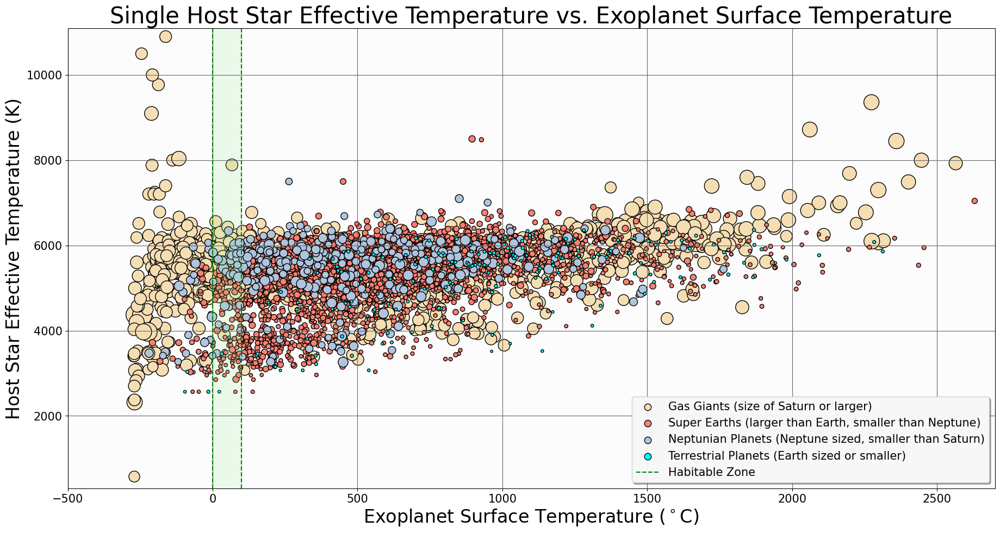

In [205]:
fig = plt.figure(figsize=(22,11))
ax = fig.add_subplot(111, facecolor='0.99')

ax.set_xlim(-500, 2700)
ax.set_ylim(300, 11100)
ax.grid(color='0.4')
ax.set_title('Single Host Star Effective Temperature vs. Exoplanet Surface Temperature')
ax.title.set_fontsize(30)
ax.set_xlabel('Exoplanet Surface Temperature ($^\circ$C)')
ax.xaxis.label.set_fontsize(24)
ax.set_ylabel('Host Star Effective Temperature (K)')
ax.yaxis.label.set_fontsize(24)

plot_exoplanets_with_size_and_label(ax=ax,
                                    exoplanets_data=st_teff_vs_pl_tsurf_plot_data,
                                    x_field='pl_tsurf_c',
                                    y_field='st_teff',
                                    size_field='pl_rade',
                                    type_field='pl_type',
                                    hz_status_field='pl_hz_status',
                                    scale_size=20,
                                    edgecolors='black',
                                    exoplanet_color_map=exoplanet_type_colors,
                                    exoplanet_label_map=exoplanet_type_labels)

plt.vlines(x=0, ymin=300, ymax=11100, colors='green', linestyles='dashed', label='Habitable Zone')
plt.vlines(x=100, ymin=300, ymax=11100, colors='green', linestyles='dashed')

ax.add_patch(plt.Rectangle(xy=(0, 0),
                           width=100,
                           height=11100,
                           color='lightgreen',
                           alpha=0.15))

ax.tick_params(axis='both', labelsize=15)

legend = ax.legend(scatterpoints=1,
                   labelcolor='black',
                   loc='best',
                   fontsize=15,
                   markerscale=2,
                   shadow=True,
                   framealpha=0.95)
set_legend_size(legend, len(exoplanet_type_labels), 80)

frame = legend.get_frame()
frame.set_facecolor('0.99')

In [145]:
st_teff_vs_pl_tsurf_plot_data_with_earth = pd.concat([st_teff_vs_pl_tsurf_plot_data, earth_data], ignore_index=True)
st_teff_vs_pl_tsurf_plot_data_with_earth.describe()

,sy_snum,sy_pnum,disc_year,pl_controv_flag,pl_orbper,pl_orbpererr1,pl_orbpererr2,pl_orbperlim,pl_orbsmax,pl_orbsmaxerr1,...,sy_vmagerr2,sy_kmag,sy_kmagerr1,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2,raw_data_calc_orb_sma,pl_tsurf_k,pl_tsurf_c
count,4575.0,4575.000000,4575.000000,4575.0,4.539000e+03,4.082000e+03,4.082000e+03,4539.000000,4575.000000,2060.000000,...,4561.000000,4569.000000,4546.000000,4537.000000,4542.000000,4541.000000,4541.000000,4575.000000,4575.000000,4575.000000
mean,1.0,1.793224,2012.597377,0.0,9.241885e+04,1.162511e+05,-2.556702e+04,-0.000661,6.059131,2.951183,...,-0.104086,10.714788,0.040195,-0.040238,12.579499,0.000565,-0.000565,2.308300,877.257179,604.107179
std,0.0,1.168227,84.347917,0.0,5.968982e+06,7.356541e+06,1.566220e+06,0.025703,137.748419,114.810972,...,0.121431,2.986428,0.250046,0.250292,2.993654,0.001003,0.001003,113.220618,485.509542,485.509542
min,1.0,1.000000,0.000000,0.0,0.000000e+00,0.000000e+00,-1.000000e+08,-1.000000,0.005800,0.000000,...,-1.133000,-1.846000,0.000000,-9.995000,0.000000,0.000000,-0.017417,0.000000,1.221287,-271.928713
25%,1.0,1.000000,2014.000000,0.0,4.562288e+00,1.403250e-05,-1.096000e-03,0.000000,0.052525,0.000777,...,-0.126000,9.018000,0.020000,-0.033000,10.977775,0.000256,-0.000527,0.051507,523.010210,249.860210
50%,1.0,1.000000,2016.000000,0.0,1.153533e+01,8.580500e-05,-8.627500e-05,0.000000,0.097600,0.002000,...,-0.080000,11.803000,0.024000,-0.024000,13.566300,0.000360,-0.000360,0.094627,816.065566,542.915566
75%,1.0,2.000000,2019.000000,0.0,3.944401e+01,1.073000e-03,-1.427750e-05,0.000000,0.228800,0.017000,...,-0.030000,13.004000,0.033000,-0.020000,14.900000,0.000527,-0.000256,0.217980,1155.150800,882.000800
max,1.0,8.000000,2024.000000,0.0,4.020000e+08,4.700000e+08,0.000000e+00,0.000000,7506.000000,5205.000000,...,0.000000,15.376000,9.995000,0.000000,19.879000,0.017417,0.000000,7652.883408,3169.563245,2896.413245


In [146]:
st_teff_vs_pl_tsurf_plot_data_with_earth.to_csv('/content/drive/My Drive/Colab Notebooks/HZExoplanetExploration/PlanetarySystemsCompositeData/ResearchPaperPlotData-C.csv')

In [147]:
st_teff_vs_pl_tsurf_plot_data_with_earth['pl_rade'].describe()

,pl_rade
count,4575.000000
mean,5.241051
std,5.045735
min,0.310000
25%,1.720000
50%,2.650000
75%,9.460500
max,33.600000


In [148]:
earth_data['pl_tsurf_c']

,pl_tsurf_c
0,188.396908
1,64.527543
2,13.975212
3,-40.566530
4,-147.285665
5,-180.398576
6,-207.607572
7,-220.789400


<ipython-input-206-bd0a9eef0416>:73: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(), weight='bold', size=18)
<ipython-input-206-bd0a9eef0416>:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks(), rotation=0, weight='bold', size=18)


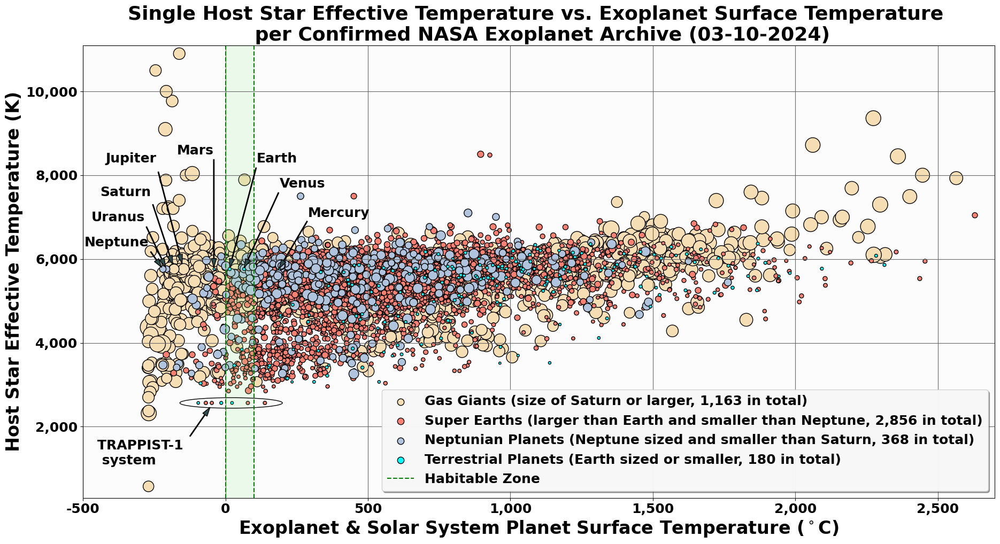

In [206]:
fig = plt.figure(figsize=(22,11))
ax = fig.add_subplot(111, facecolor='0.99')

ax.set_xlim(-500, 2700)
ax.set_ylim(300, 11100)
ax.grid(color='0.4')
ax.set_title('Single Host Star Effective Temperature vs. Exoplanet Surface Temperature \n per Confirmed NASA Exoplanet Archive (03-10-2024)', fontweight ='bold')
ax.title.set_fontsize(26)
ax.set_xlabel('Exoplanet & Solar System Planet Surface Temperature ($^\circ$C)', fontweight ='bold')
ax.xaxis.label.set_fontsize(24)
ax.set_ylabel('Host Star Effective Temperature (K)', fontweight ='bold')
ax.yaxis.label.set_fontsize(24)

plot_exoplanets_with_size(ax=ax,
                          exoplanets_data=st_teff_vs_pl_tsurf_plot_data_with_earth,
                          x_field='pl_tsurf_c',
                          y_field='st_teff',
                          size_field='pl_rade',
                          type_field='pl_type',
                          hz_status_field='pl_hz_status',
                          scale_size=20,
                          edgecolors='black',
                          exoplanet_color_map=exoplanet_type_colors_with_solar_system_planets_and_counts,
                          exoplanet_label_map=exoplanet_type_labels_with_solar_system_planets_and_counts)

ax.annotate('Mercury', xy=(188.40, 5772), xytext=(290, 7000),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0))

ax.annotate('Venus', xy=(64.53, 5772), xytext=(190, 7700),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0.01))

ax.annotate('Earth', xy=(13.98, 5772), xytext=(110, 8300),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0.01))

ax.annotate('Mars', xy=(-40.57, 5772), xytext=(-170, 8500),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0.01))

ax.annotate('Jupiter', xy=(-147.29, 5772), xytext=(-420, 8300),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0.05))

ax.annotate('Saturn', xy=(-180.40, 5772), xytext=(-440, 7500),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0.06))

ax.annotate('Uranus', xy=(-207.61, 5772), xytext=(-470, 6900),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0.03))

ax.annotate('Neptune', xy=(-220.79, 5772), xytext=(-495, 6300),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0.06))

plt.vlines(x=0, ymin=300, ymax=11100, colors='green', linestyles='dashed', label='Habitable Zone')
plt.vlines(x=100, ymin=300, ymax=11100, colors='green', linestyles='dashed')

ax.add_patch(plt.Rectangle(xy=(0, 0),
                           width=100,
                           height=11100,
                           color='lightgreen',
                           alpha=0.15))

ell = Ellipse(xy=[20,2566], width=360, height=250, angle=0, edgecolor='black', lw=1, facecolor='none')
ax.add_artist(ell)
ax.annotate('TRAPPIST-1 \n system', xy=(-50, 2500), xytext=(-450, 1100),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0.05))

ax.set_yticklabels(ax.get_yticks(), weight='bold', size=18)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.set_xticklabels(ax.get_xticks(), rotation=0, weight='bold', size=18)
ax.xaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))

legend_properties = {'size':18, 'weight':'bold'}
legend = ax.legend(scatterpoints=1,
                   labelcolor='black',
                   loc='best',
                   markerscale=2,
                   shadow=True,
                   framealpha=0.95,
                   prop=legend_properties)
set_legend_size(legend, len(exoplanet_type_labels), 80)

frame = legend.get_frame()
frame.set_facecolor('0.99')

In [180]:
st_teff_vs_pl_tsurf_plot_data['pl_tsurf_k'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,pl_tsurf_k
count,4567.000000
mean,878.431386
std,485.088098
min,1.221287
25%,524.188214
50%,818.291605
75%,1155.655044
90%,1538.655746
95%,1778.860285
99%,2213.608691


<ipython-input-207-94256f0ac9cf>:73: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(), weight='bold', size=18)
<ipython-input-207-94256f0ac9cf>:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks(), rotation=0, weight='bold', size=18)


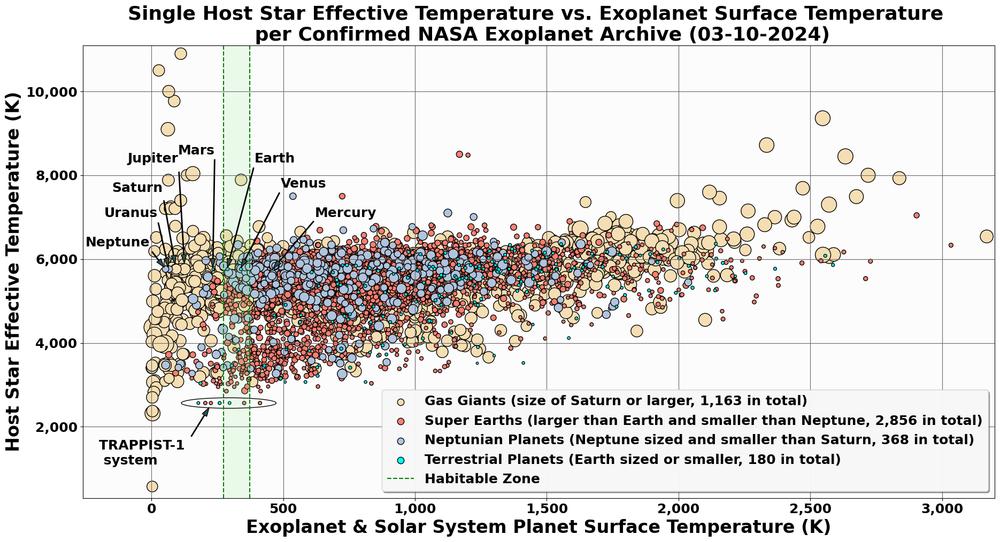

In [207]:
fig = plt.figure(figsize=(22,11))
ax = fig.add_subplot(111, facecolor='0.99')

ax.set_xlim(-260, 3200)
ax.set_ylim(300, 11100)
ax.grid(color='0.4')
ax.set_title('Single Host Star Effective Temperature vs. Exoplanet Surface Temperature \n per Confirmed NASA Exoplanet Archive (03-10-2024)', fontweight ='bold')
ax.title.set_fontsize(26)
ax.set_xlabel('Exoplanet & Solar System Planet Surface Temperature (K)', fontweight ='bold')
ax.xaxis.label.set_fontsize(24)
ax.set_ylabel('Host Star Effective Temperature (K)', fontweight ='bold')
ax.yaxis.label.set_fontsize(24)

plot_exoplanets_with_size(ax=ax,
                          exoplanets_data=st_teff_vs_pl_tsurf_plot_data_with_earth,
                          x_field='pl_tsurf_k',
                          y_field='st_teff',
                          size_field='pl_rade',
                          type_field='pl_type',
                          hz_status_field='pl_hz_status',
                          scale_size=20,
                          edgecolors='black',
                          exoplanet_color_map=exoplanet_type_colors_with_solar_system_planets_and_counts,
                          exoplanet_label_map=exoplanet_type_labels_with_solar_system_planets_and_counts)

ax.annotate('Mercury', xy=(461.55, 5772), xytext=(620, 7000),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0))

ax.annotate('Venus', xy=(337.68, 5772), xytext=(490, 7700),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0.01))

ax.annotate('Earth', xy=(287.13, 5772), xytext=(390, 8300),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0.01))

ax.annotate('Mars', xy=(232.58, 5772), xytext=(100, 8500),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0.01))

ax.annotate('Jupiter', xy=(125.86, 5772), xytext=(-90, 8300),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0.05))

ax.annotate('Saturn', xy=(92.75, 5772), xytext=(-150, 7600),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0.06))

ax.annotate('Uranus', xy=(65.54, 5772), xytext=(-180, 7000),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0.03))

ax.annotate('Neptune', xy=(52.36, 5772), xytext=(-250, 6300),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0.06))

plt.vlines(x=273.15, ymin=300, ymax=11100, colors='green', linestyles='dashed', label='Habitable Zone')
plt.vlines(x=373.15, ymin=300, ymax=11100, colors='green', linestyles='dashed')

ax.add_patch(plt.Rectangle(xy=(273.15, 0),
                           width=100,
                           height=11100,
                           color='lightgreen',
                           alpha=0.15))

ell = Ellipse(xy=[293.15,2566], width=360, height=250, angle=0, edgecolor='black', lw=1, facecolor='none')
ax.add_artist(ell)
ax.annotate('TRAPPIST-1 \n system', xy=(223, 2500), xytext=(-200, 1100),
            fontsize=18, fontweight='bold', color='black',
            arrowprops=dict(facecolor='darkslategray', width=1, headwidth=7, shrink=0.05))

ax.set_yticklabels(ax.get_yticks(), weight='bold', size=18)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.set_xticklabels(ax.get_xticks(), rotation=0, weight='bold', size=18)
ax.xaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))

legend_properties = {'size':18, 'weight':'bold'}
legend = ax.legend(scatterpoints=1,
                   labelcolor='black',
                   loc='best',
                   markerscale=2,
                   shadow=True,
                   framealpha=0.95,
                   prop=legend_properties)
set_legend_size(legend, len(exoplanet_type_labels), 80)

frame = legend.get_frame()
frame.set_facecolor('0.99')

In [152]:
st_teff_vs_pl_eqt_plot_data = exoplanets_data.loc[(~np.isnan(exoplanets_data['sy_snum'])) & (exoplanets_data['sy_snum'] == 1)
                                                  & (~np.isnan(exoplanets_data['st_teff']))
                                                  & (~np.isnan(exoplanets_data['pl_eqt']))
                                                  & (~np.isnan(exoplanets_data['pl_rade']))
                                                  & (exoplanets_data['pl_type'] != 'N/A')
                                                  & (exoplanets_data['pl_hz_status'] != 'N/A')]

In [153]:
st_teff_vs_pl_eqt_plot_data.describe()

,sy_snum,sy_pnum,disc_year,pl_controv_flag,pl_orbper,pl_orbpererr1,pl_orbpererr2,pl_orbperlim,pl_orbsmax,pl_orbsmaxerr1,...,sy_vmagerr2,sy_kmag,sy_kmagerr1,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2,raw_data_calc_orb_sma,pl_tsurf_k,pl_tsurf_c
count,3716.0,3716.000000,3716.000000,3716.0,3.693000e+03,3.237000e+03,3.237000e+03,3693.000000,3716.000000,1248.000000,...,3705.00000,3712.000000,3689.000000,3684.000000,3692.000000,3692.000000,3692.000000,3716.000000,3716.000000,3716.000000
mean,1.0,1.789828,2016.514263,0.0,1.131383e+05,1.464711e+05,-3.216734e+04,-0.000812,6.175797,4.528751,...,-0.11813,11.732086,0.032559,-0.032577,13.564328,0.000504,-0.000504,2.350481,965.138006,691.988006
std,0.0,1.158369,3.377395,0.0,6.617443e+06,8.261115e+06,1.758802e+06,0.028494,151.691388,147.462070,...,0.12886,2.000643,0.165353,0.165464,2.035456,0.000828,0.000828,125.618538,462.548618,462.548618
min,1.0,1.000000,1999.000000,0.0,1.797190e-01,0.000000e+00,-1.000000e+08,-1.000000,0.005800,0.000000,...,-1.13300,2.636000,0.011000,-9.995000,3.820150,0.000118,-0.017417,0.000000,1.221287,-271.928713
25%,1.0,1.000000,2014.000000,0.0,4.096390e+00,9.550000e-06,-2.092000e-04,0.000000,0.049100,0.000600,...,-0.13700,10.819000,0.020000,-0.034000,12.551800,0.000258,-0.000513,0.048634,622.604902,349.454902
50%,1.0,1.000000,2016.000000,0.0,9.070977e+00,4.285000e-05,-4.273000e-05,0.000000,0.081800,0.001100,...,-0.09200,12.290000,0.024000,-0.024000,14.080550,0.000360,-0.000360,0.080903,890.195000,617.045000
75%,1.0,2.000000,2019.000000,0.0,2.130023e+01,2.092000e-04,-9.540000e-06,0.000000,0.152000,0.003000,...,-0.05700,13.197000,0.034000,-0.021000,15.065675,0.000513,-0.000258,0.146873,1235.182862,962.032862
max,1.0,8.000000,2024.000000,0.0,4.020000e+08,4.700000e+08,0.000000e+00,0.000000,7506.000000,5205.000000,...,-0.00200,15.271000,9.995000,-0.011000,19.879000,0.017417,-0.000118,7652.883408,3169.563245,2896.413245


In [154]:
st_teff_vs_pl_eqt_plot_data['pl_hz_status'].value_counts()

,count
pl_hz_status,
Too Hot,3497
In HZ,131
Too Cold,88


In [156]:
st_teff_vs_pl_eqt_plot_data.loc[(st_teff_vs_pl_eqt_plot_data['pl_hz_status'] == 'In HZ'), 'pl_type'] = 'HabitableZone-Planets'

In [157]:
st_teff_vs_pl_eqt_plot_data['pl_type'].value_counts()

,count
pl_type,
Super-Earths,2566
Gas-Giants,576
Neptunian-Planets,272
Terrestrial-Planets,171
HabitableZone-Planets,131


In [158]:
st_teff_vs_pl_eqt_plot_data['st_teff'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,st_teff
count,3716.000000
mean,5420.653644
std,807.232009
min,575.000000
25%,5078.000000
50%,5610.000000
75%,5933.000000
90%,6177.000000
95%,6341.000000
99%,6825.100000


In [159]:
st_teff_vs_pl_eqt_plot_data['pl_eqt'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,pl_eqt
count,3716.000000
mean,900.205328
std,443.590744
min,96.000000
25%,569.000000
50%,813.500000
75%,1135.250000
90%,1532.500000
95%,1741.000000
99%,2211.700000


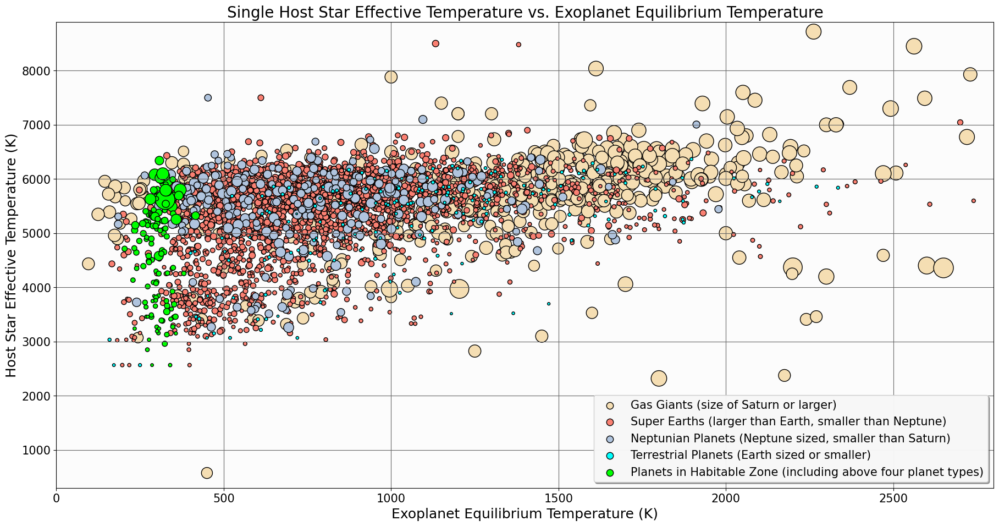

In [211]:
fig = plt.figure(figsize=(22,11))
ax = fig.add_subplot(111, facecolor='0.99')

ax.set_xlim(0, 2800)
ax.set_ylim(300, 8900)
ax.grid(color='0.4')
ax.set_title('Single Host Star Effective Temperature vs. Exoplanet Equilibrium Temperature')
ax.title.set_fontsize(20)
ax.set_xlabel('Exoplanet Equilibrium Temperature (K)')
ax.xaxis.label.set_fontsize(18)
ax.set_ylabel('Host Star Effective Temperature (K)')
ax.yaxis.label.set_fontsize(18)

plot_exoplanets_with_size_and_label(ax=ax,
                                    exoplanets_data=st_teff_vs_pl_eqt_plot_data,
                                    x_field='pl_eqt',
                                    y_field='st_teff',
                                    size_field='pl_rade',
                                    type_field='pl_type',
                                    hz_status_field='pl_hz_status',
                                    scale_size=20,
                                    edgecolors='black',
                                    exoplanet_color_map=exoplanet_type_with_hz_colors,
                                    exoplanet_label_map=exoplanet_type_with_hz_labels)

ax.tick_params(axis='both', labelsize=15)

legend = ax.legend(scatterpoints=1,
                   labelcolor='black',
                   loc='best',
                   fontsize=15,
                   markerscale=2,
                   shadow=True,
                   framealpha=0.95)
set_legend_size(legend, len(exoplanet_type_with_hz_labels), 80)

frame = legend.get_frame()
frame.set_facecolor('0.99')

In [212]:
st_teff_vs_pl_eqt_plot_data_with_earth = pd.concat([st_teff_vs_pl_eqt_plot_data, earth_data], ignore_index=True)
st_teff_vs_pl_eqt_plot_data_with_earth.describe()

,sy_snum,sy_pnum,disc_year,pl_controv_flag,pl_orbper,pl_orbpererr1,pl_orbpererr2,pl_orbperlim,pl_orbsmax,pl_orbsmaxerr1,...,sy_vmagerr2,sy_kmag,sy_kmagerr1,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2,raw_data_calc_orb_sma,pl_tsurf_k,pl_tsurf_c
count,3724.0,3724.000000,3724.000000,3724.0,3.701000e+03,3.245000e+03,3.245000e+03,3701.000000,3724.000000,1256.000000,...,3713.000000,3720.000000,3697.000000,3692.000000,3700.000000,3700.000000,3700.000000,3724.000000,3724.000000,3724.000000
mean,1.0,1.803169,2012.182331,0.0,1.128938e+05,1.461100e+05,-3.208803e+04,-0.000811,6.180705,4.499906,...,-0.117876,11.706856,0.032489,-0.032507,13.535000,0.000503,-0.000503,2.345432,963.509206,690.359206
std,0.0,1.192321,93.436397,0.0,6.610287e+06,8.250925e+06,1.756633e+06,0.028463,151.529089,146.991761,...,0.128838,2.071089,0.165180,0.165291,2.128658,0.000827,0.000827,125.483548,463.427548,463.427548
min,1.0,1.000000,0.000000,0.0,0.000000e+00,0.000000e+00,-1.000000e+08,-1.000000,0.005800,0.000000,...,-1.133000,0.000000,0.000000,-9.995000,0.000000,0.000000,-0.017417,0.000000,1.221287,-271.928713
25%,1.0,1.000000,2014.000000,0.0,4.086050e+00,9.420000e-06,-2.082000e-04,0.000000,0.049100,0.000600,...,-0.137000,10.809750,0.020000,-0.034000,12.528375,0.000257,-0.000512,0.048523,621.005101,347.855101
50%,1.0,1.000000,2016.000000,0.0,9.034199e+00,4.242000e-05,-4.234000e-05,0.000000,0.082000,0.001050,...,-0.092000,12.289000,0.024000,-0.024000,14.072450,0.000360,-0.000360,0.080702,888.083183,614.933183
75%,1.0,2.000000,2019.000000,0.0,2.122265e+01,2.082000e-04,-9.400000e-06,0.000000,0.152800,0.003000,...,-0.057000,13.195000,0.034000,-0.020000,15.064900,0.000512,-0.000257,0.146680,1233.312418,960.162418
max,1.0,8.000000,2024.000000,0.0,4.020000e+08,4.700000e+08,0.000000e+00,0.000000,7506.000000,5205.000000,...,0.000000,15.271000,9.995000,0.000000,19.879000,0.017417,0.000000,7652.883408,3169.563245,2896.413245


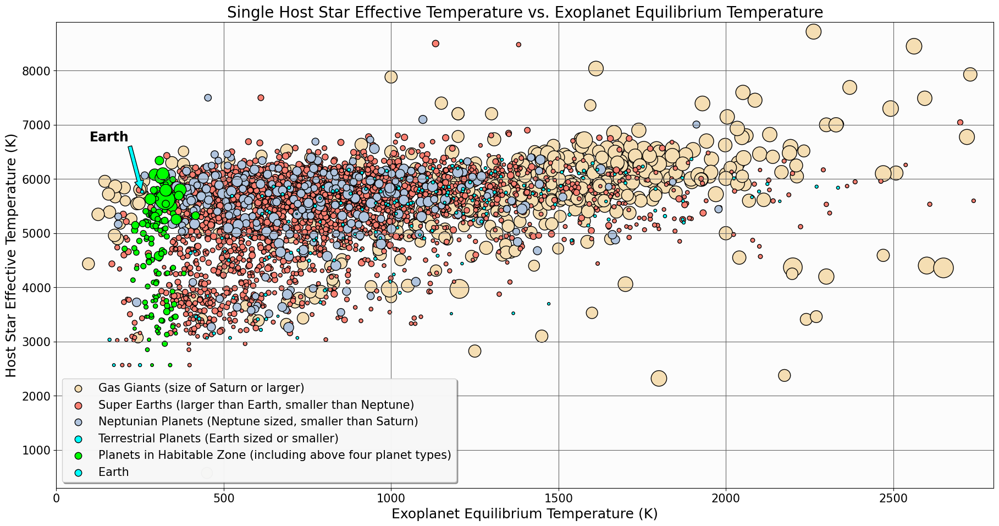

In [213]:
fig = plt.figure(figsize=(22,11))
ax = fig.add_subplot(111, facecolor='0.99')

ax.set_xlim(0, 2800)
ax.set_ylim(300, 8900)
ax.grid(color='0.4')
ax.set_title('Single Host Star Effective Temperature vs. Exoplanet Equilibrium Temperature')
ax.title.set_fontsize(20)
ax.set_xlabel('Exoplanet Equilibrium Temperature (K)')
ax.xaxis.label.set_fontsize(18)
ax.set_ylabel('Host Star Effective Temperature (K)')
ax.yaxis.label.set_fontsize(18)

plot_exoplanets_with_size_and_label(ax=ax,
                          exoplanets_data=st_teff_vs_pl_eqt_plot_data_with_earth,
                          x_field='pl_eqt',
                          y_field='st_teff',
                          size_field='pl_rade',
                          type_field='pl_type',
                          hz_status_field='pl_hz_status',
                          scale_size=20,
                          edgecolors='black',
                          exoplanet_color_map=exoplanet_type_with_hz_colors_with_earth,
                          exoplanet_label_map=exoplanet_type_with_hz_labels_with_earth)

ax.annotate('Earth', xy=(255, 5780), xytext=(100, 6700),
            fontsize=17, fontweight='bold',
            arrowprops=dict(facecolor='cyan', width=5, headwidth=12, shrink=0.02))

ax.tick_params(axis='both', labelsize=15)

legend = ax.legend(scatterpoints=1,
                   labelcolor='black',
                   loc='best',
                   fontsize=15,
                   markerscale=2,
                   shadow=True,
                   framealpha=0.95)
set_legend_size(legend, len(exoplanet_type_with_hz_labels_with_earth), 80)

frame = legend.get_frame()
frame.set_facecolor('0.99')

In [214]:
st_teff_vs_pl_insol_plot_data = exoplanets_data.loc[(~np.isnan(exoplanets_data['sy_snum'])) & (exoplanets_data['sy_snum'] == 1)
                                                  & (~np.isnan(exoplanets_data['st_teff']))
                                                  & (~np.isnan(exoplanets_data['pl_insol'])) & (exoplanets_data['pl_insol'] != 0)
                                                  & (~np.isnan(exoplanets_data['pl_rade']))
                                                  & (exoplanets_data['pl_type'] != 'N/A')
                                                  & (exoplanets_data['pl_hz_status'] != 'N/A')]

In [215]:
st_teff_vs_pl_insol_plot_data.describe()

,sy_snum,sy_pnum,disc_year,pl_controv_flag,pl_orbper,pl_orbpererr1,pl_orbpererr2,pl_orbperlim,pl_orbsmax,pl_orbsmaxerr1,...,sy_vmagerr2,sy_kmag,sy_kmagerr1,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2,raw_data_calc_orb_sma,pl_tsurf_k,pl_tsurf_c
count,3556.0,3556.000000,3556.000000,3556.0,3556.000000,3111.000000,3111.000000,3556.000000,3556.000000,1107.000000,...,3550.000000,3554.000000,3532.000000,3525.000000,3532.000000,3531.000000,3531.000000,3556.000000,3556.000000,3556.000000
mean,1.0,1.799213,2016.585489,0.0,33.447417,1.237123,-0.804855,-0.000281,0.142149,0.007577,...,-0.118783,11.822113,0.032208,-0.032237,13.662627,0.000481,-0.000481,0.142578,964.650223,691.500223
std,0.0,1.151607,3.177940,0.0,173.731169,36.258429,22.670075,0.016769,0.263386,0.053951,...,0.124748,1.903784,0.168515,0.168681,1.894945,0.000787,0.000787,0.263878,452.966183,452.966183
min,1.0,1.000000,1999.000000,0.0,0.280324,0.000000,-1130.000000,-1.000000,0.006000,0.000000,...,-1.133000,3.261000,0.011000,-9.995000,5.240200,0.000118,-0.017417,0.005850,96.970074,-176.179926
25%,1.0,1.000000,2014.000000,0.0,4.139366,0.000009,-0.000200,0.000000,0.049100,0.000600,...,-0.146250,10.966250,0.020000,-0.034000,12.678900,0.000257,-0.000506,0.049390,626.532388,353.382388
50%,1.0,1.000000,2016.000000,0.0,9.162845,0.000041,-0.000041,0.000000,0.081500,0.001100,...,-0.092000,12.348500,0.024000,-0.024000,14.124000,0.000358,-0.000358,0.081720,885.616288,612.466288
75%,1.0,2.000000,2019.000000,0.0,21.584342,0.000200,-0.000009,0.000000,0.149350,0.002710,...,-0.057000,13.214000,0.034000,-0.020000,15.074525,0.000506,-0.000257,0.148838,1224.083479,950.933479
max,1.0,8.000000,2024.000000,0.0,5138.000000,1500.000000,0.000000,0.000000,6.150000,1.300000,...,-0.002000,14.561000,9.995000,-0.011000,19.879000,0.017417,-0.000118,6.122882,3169.563245,2896.413245


In [216]:
st_teff_vs_pl_insol_plot_data['pl_hz_status'].value_counts()

,count
pl_hz_status,
Too Hot,3368
In HZ,130
Too Cold,58


In [217]:
st_teff_vs_pl_insol_plot_data.loc[(st_teff_vs_pl_insol_plot_data['pl_hz_status'] == 'In HZ'), 'pl_type'] = 'HabitableZone-Planets'

In [218]:
st_teff_vs_pl_insol_plot_data['pl_type'].value_counts()

,count
pl_type,
Super-Earths,2516
Gas-Giants,481
Neptunian-Planets,259
Terrestrial-Planets,170
HabitableZone-Planets,130


In [219]:
st_teff_vs_pl_insol_plot_data['st_teff'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,st_teff
count,3556.000000
mean,5409.589303
std,790.271500
min,2566.000000
25%,5069.750000
50%,5610.000000
75%,5925.000000
90%,6170.000000
95%,6327.000000
99%,6769.900000


In [220]:
st_teff_vs_pl_insol_plot_data['pl_insol_log'] = np.log10(st_teff_vs_pl_insol_plot_data['pl_insol'])
st_teff_vs_pl_insol_plot_data['pl_insol_log'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,pl_insol_log
count,3556.000000
mean,1.920499
std,0.859411
min,-2.000000
25%,1.378670
50%,1.973474
75%,2.536306
90%,2.973285
95%,3.213465
99%,3.614043


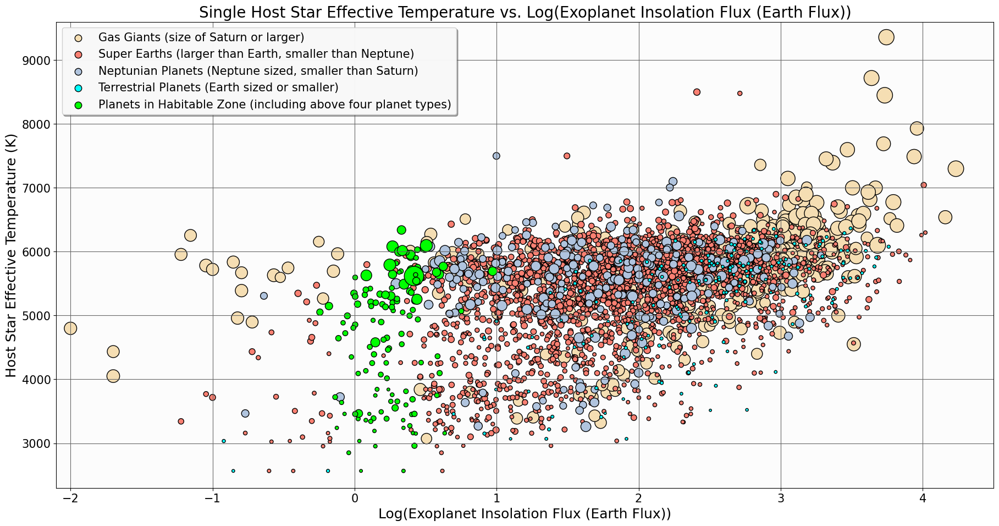

In [230]:
fig = plt.figure(figsize=(22,11))
ax = fig.add_subplot(111, facecolor='0.99')

ax.set_xlim(-2.1, 4.5)
ax.set_ylim(2300, 9600)
ax.grid(color='0.4')
ax.set_title('Single Host Star Effective Temperature vs. Log(Exoplanet Insolation Flux (Earth Flux))')
ax.title.set_fontsize(20)
ax.set_xlabel('Log(Exoplanet Insolation Flux (Earth Flux))')
ax.xaxis.label.set_fontsize(18)
ax.set_ylabel('Host Star Effective Temperature (K)')
ax.yaxis.label.set_fontsize(18)

plot_exoplanets_with_size_and_label(ax=ax,
                                    exoplanets_data=st_teff_vs_pl_insol_plot_data,
                                    x_field='pl_insol_log',
                                    y_field='st_teff',
                                    size_field='pl_rade',
                                    type_field='pl_type',
                                    hz_status_field='pl_hz_status',
                                    scale_size=20,
                                    edgecolors='black',
                                    exoplanet_color_map=exoplanet_type_with_hz_colors,
                                    exoplanet_label_map=exoplanet_type_with_hz_labels)

ax.tick_params(axis='both', labelsize=15)

legend = ax.legend(scatterpoints=1,
                   labelcolor='black',
                   loc='best',
                   fontsize=15,
                   markerscale=2,
                   shadow=True,
                   framealpha=0.96)
set_legend_size(legend, len(exoplanet_type_with_hz_labels), 80)

frame = legend.get_frame()
frame.set_facecolor('0.99')

In [223]:
st_teff_vs_pl_insol_plot_data_with_earth = pd.concat([st_teff_vs_pl_insol_plot_data, earth_data], ignore_index=True)
st_teff_vs_pl_insol_plot_data_with_earth.describe()

,sy_snum,sy_pnum,disc_year,pl_controv_flag,pl_orbper,pl_orbpererr1,pl_orbpererr2,pl_orbperlim,pl_orbsmax,pl_orbsmaxerr1,...,sy_kmag,sy_kmagerr1,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2,raw_data_calc_orb_sma,pl_tsurf_k,pl_tsurf_c,pl_insol_log
count,3564.0,3564.000000,3564.000000,3564.0,3564.000000,3119.000000,3119.000000,3564.000000,3564.000000,1115.000000,...,3562.000000,3540.000000,3533.000000,3540.000000,3539.000000,3539.000000,3564.000000,3564.000000,3564.000000,3556.000000
mean,1.0,1.813131,2012.058923,0.0,33.372339,1.233950,-0.802791,-0.000281,0.160820,0.007523,...,11.795561,0.032135,-0.032164,13.631751,0.000480,-0.000480,0.142258,962.949395,689.799395,1.920499
std,0.0,1.187164,95.500533,0.0,173.543241,36.211939,22.641010,0.016751,0.674649,0.053761,...,1.982304,0.168332,0.168497,2.000928,0.000786,0.000786,0.263668,453.923667,453.923667,0.859411
min,1.0,1.000000,0.000000,0.0,0.000000,0.000000,-1130.000000,-1.000000,0.006000,0.000000,...,0.000000,0.000000,-9.995000,0.000000,0.000000,-0.017417,0.000000,52.360600,-220.789400,-2.000000
25%,1.0,1.000000,2014.000000,0.0,4.125436,0.000009,-0.000200,0.000000,0.049200,0.000600,...,10.959750,0.020000,-0.034000,12.671425,0.000257,-0.000506,0.049305,624.201463,351.051463,1.378670
50%,1.0,1.000000,2016.000000,0.0,9.119845,0.000041,-0.000041,0.000000,0.081800,0.001100,...,12.341500,0.024000,-0.024000,14.119750,0.000357,-0.000357,0.081525,884.333747,611.183747,1.973474
75%,1.0,2.000000,2019.000000,0.0,21.443691,0.000200,-0.000009,0.000000,0.150200,0.002700,...,13.213500,0.034000,-0.020000,15.073100,0.000506,-0.000257,0.148426,1222.792334,949.642334,2.536306
max,1.0,8.000000,2024.000000,0.0,5138.000000,1500.000000,0.000000,0.000000,30.070000,1.300000,...,14.561000,9.995000,0.000000,19.879000,0.017417,0.000000,6.122882,3169.563245,2896.413245,4.233580


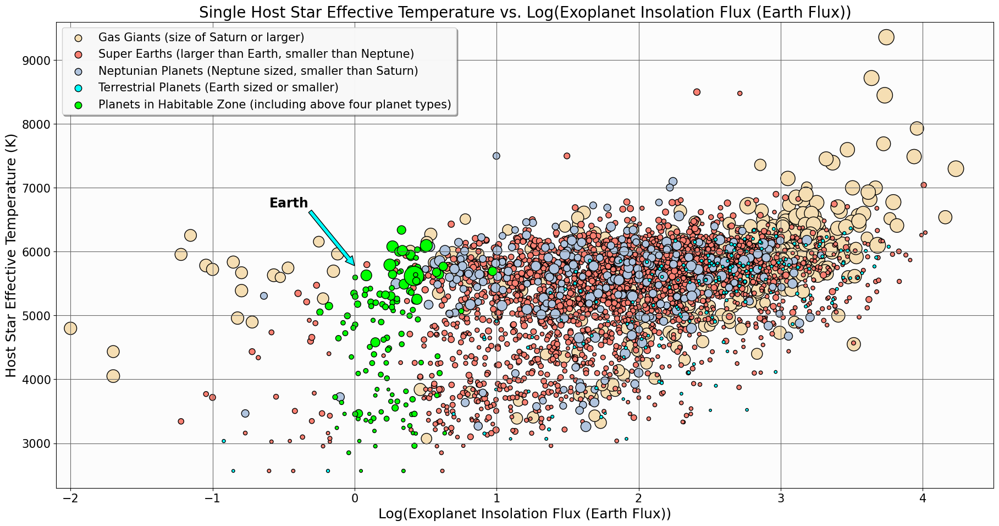

In [239]:
fig = plt.figure(figsize=(22,11))
ax = fig.add_subplot(111, facecolor='0.99')

ax.set_xlim(-2.1, 4.5)
ax.set_ylim(2300, 9600)
ax.grid(color='0.4')
ax.set_title('Single Host Star Effective Temperature vs. Log(Exoplanet Insolation Flux (Earth Flux))')
ax.title.set_fontsize(20)
ax.set_xlabel('Log(Exoplanet Insolation Flux (Earth Flux))')
ax.xaxis.label.set_fontsize(18)
ax.set_ylabel('Host Star Effective Temperature (K)')
ax.yaxis.label.set_fontsize(18)

plot_exoplanets_with_size_and_label(ax=ax,
                                    exoplanets_data=st_teff_vs_pl_insol_plot_data_with_earth,
                                    x_field='pl_insol_log',
                                    y_field='st_teff',
                                    size_field='pl_rade',
                                    type_field='pl_type',
                                    hz_status_field='pl_hz_status',
                                    scale_size=20,
                                    edgecolors='black',
                                    exoplanet_color_map=exoplanet_type_with_hz_colors_with_earth,
                                    exoplanet_label_map=exoplanet_type_with_hz_labels)

ax.annotate('Earth', xy=(0, 5780), xytext=(-0.6, 6700),
            fontsize=17, fontweight='bold',
            arrowprops=dict(facecolor='cyan', width=5, headwidth=12, shrink=0))

ax.tick_params(axis='both', labelsize=15)

legend = ax.legend(scatterpoints=1,
                   labelcolor='black',
                   loc='best',
                   fontsize=15,
                   markerscale=2,
                   shadow=True,
                   framealpha=0.96)
set_legend_size(legend, len(exoplanet_type_with_hz_labels), 80)

frame = legend.get_frame()
frame.set_facecolor('0.99')

In [231]:
st_teff_vs_pl_orb_plot_data = exoplanets_data.loc[(~np.isnan(exoplanets_data['sy_snum'])) & (exoplanets_data['sy_snum'] == 1)
                                                  & (~np.isnan(exoplanets_data['st_teff']))
                                                  & (~np.isnan(exoplanets_data['pl_orbsmax']))
                                                  & (~np.isnan(exoplanets_data['pl_rade']))
                                                  & (exoplanets_data['pl_type'] != 'N/A')
                                                  & (exoplanets_data['pl_hz_status'] != 'N/A')]

In [232]:
st_teff_vs_pl_orb_plot_data.describe()

,sy_snum,sy_pnum,disc_year,pl_controv_flag,pl_orbper,pl_orbpererr1,pl_orbpererr2,pl_orbperlim,pl_orbsmax,pl_orbsmaxerr1,...,sy_vmagerr2,sy_kmag,sy_kmagerr1,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2,raw_data_calc_orb_sma,pl_tsurf_k,pl_tsurf_c
count,4567.0,4567.000000,4567.000000,4567.0,4.531000e+03,4.074000e+03,4.074000e+03,4531.000000,4567.000000,2052.000000,...,4553.000000,4561.000000,4538.000000,4529.000000,4534.000000,4533.000000,4533.000000,4567.000000,4567.000000,4567.000000
mean,1.0,1.782352,2016.122838,0.0,9.258203e+04,1.164793e+05,-2.561722e+04,-0.000662,6.054924,2.962688,...,-0.104269,10.733582,0.040266,-0.040309,12.601695,0.000566,-0.000566,2.312344,878.431386,605.281386
std,0.0,1.139970,4.209268,0.0,5.974249e+06,7.363760e+06,1.567757e+06,0.025726,137.868350,115.034518,...,0.121459,2.955102,0.250260,0.250507,2.949240,0.001004,0.001004,113.319719,485.088098,485.088098
min,1.0,1.000000,1995.000000,0.0,1.797190e-01,0.000000e+00,-1.000000e+08,-1.000000,0.005800,0.000000,...,-1.133000,-1.846000,0.011000,-9.995000,2.364310,0.000118,-0.017417,0.000000,1.221287,-271.928713
25%,1.0,1.000000,2014.000000,0.0,4.581940e+00,1.443000e-05,-1.100000e-03,0.000000,0.052500,0.000800,...,-0.126000,9.036000,0.020000,-0.033000,10.988750,0.000257,-0.000527,0.051673,524.188214,251.038214
50%,1.0,1.000000,2016.000000,0.0,1.155530e+01,8.600000e-05,-8.700000e-05,0.000000,0.097300,0.002000,...,-0.080000,11.805000,0.024000,-0.024000,13.569150,0.000360,-0.000360,0.094910,818.291605,545.141605
75%,1.0,2.000000,2019.000000,0.0,3.952744e+01,1.092000e-03,-1.454750e-05,0.000000,0.227400,0.017425,...,-0.030000,13.005000,0.033000,-0.020000,14.901875,0.000527,-0.000257,0.218411,1155.655044,882.505044
max,1.0,8.000000,2024.000000,0.0,4.020000e+08,4.700000e+08,0.000000e+00,0.000000,7506.000000,5205.000000,...,-0.001000,15.376000,9.995000,-0.011000,19.879000,0.017417,-0.000118,7652.883408,3169.563245,2896.413245


In [233]:
st_teff_vs_pl_orb_plot_data['pl_hz_status'].value_counts()

,count
pl_hz_status,
Too Hot,3942
Too Cold,399
In HZ,226


In [234]:
st_teff_vs_pl_orb_plot_data.loc[(st_teff_vs_pl_orb_plot_data['pl_hz_status'] == 'In HZ'), 'pl_type'] = 'HabitableZone-Planets'

In [235]:
st_teff_vs_pl_orb_plot_data['pl_type'].value_counts()

,count
pl_type,
Super-Earths,2733
Gas-Giants,1096
Neptunian-Planets,335
HabitableZone-Planets,226
Terrestrial-Planets,177


In [236]:
st_teff_vs_pl_orb_plot_data['st_teff'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,st_teff
count,4567.000000
mean,5369.873987
std,933.297778
min,575.000000
25%,4954.000000
50%,5564.000000
75%,5900.000000
90%,6166.000000
95%,6323.400000
99%,6811.420000


In [237]:
st_teff_vs_pl_orb_plot_data['pl_orbsmax'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,pl_orbsmax
count,4567.000000
mean,6.054924
std,137.868350
min,0.005800
25%,0.052500
50%,0.097300
75%,0.227400
90%,1.170000
95%,2.788000
99%,18.375680


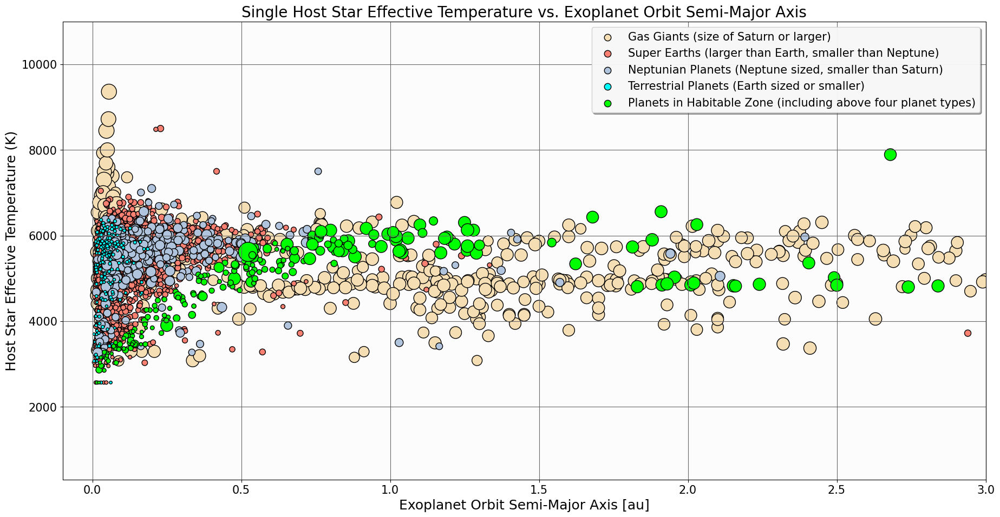

In [243]:
fig = plt.figure(figsize=(22,11))
ax = fig.add_subplot(111, facecolor='0.99')

ax.set_xlim(-0.1, 3)
ax.set_ylim(300, 11000)
ax.grid(color='0.4')
ax.set_title('Single Host Star Effective Temperature vs. Exoplanet Orbit Semi-Major Axis')
ax.title.set_fontsize(20)
ax.set_xlabel('Exoplanet Orbit Semi-Major Axis [au]')
ax.xaxis.label.set_fontsize(18)
ax.set_ylabel('Host Star Effective Temperature (K)')
ax.yaxis.label.set_fontsize(18)

plot_exoplanets_with_size_and_label(ax=ax,
                                    exoplanets_data=st_teff_vs_pl_orb_plot_data,
                                    x_field='pl_orbsmax',
                                    y_field='st_teff',
                                    size_field='pl_rade',
                                    type_field='pl_type',
                                    hz_status_field='pl_hz_status',
                                    scale_size=20,
                                    edgecolors='black',
                                    exoplanet_color_map=exoplanet_type_with_hz_colors,
                                    exoplanet_label_map=exoplanet_type_with_hz_labels)

ax.tick_params(axis='both', labelsize=15)

legend = ax.legend(scatterpoints=1,
                   labelcolor='black',
                   loc='best',
                   fontsize=15,
                   markerscale=2,
                   shadow=True,
                   framealpha=0.95)
set_legend_size(legend, len(exoplanet_type_with_hz_labels), 80)

frame = legend.get_frame()
frame.set_facecolor('0.99')

In [244]:
st_teff_vs_pl_orb_plot_data_with_earth = pd.concat([st_teff_vs_pl_orb_plot_data, earth_data], ignore_index=True)
st_teff_vs_pl_orb_plot_data_with_earth.describe()

,sy_snum,sy_pnum,disc_year,pl_controv_flag,pl_orbper,pl_orbpererr1,pl_orbpererr2,pl_orbperlim,pl_orbsmax,pl_orbsmaxerr1,...,sy_vmagerr2,sy_kmag,sy_kmagerr1,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2,raw_data_calc_orb_sma,pl_tsurf_k,pl_tsurf_c
count,4575.0,4575.000000,4575.000000,4575.0,4.539000e+03,4.082000e+03,4.082000e+03,4539.000000,4575.000000,2060.000000,...,4561.000000,4569.000000,4546.000000,4537.000000,4542.000000,4541.000000,4541.000000,4575.000000,4575.000000,4575.000000
mean,1.0,1.793224,2012.597377,0.0,9.241885e+04,1.162511e+05,-2.556702e+04,-0.000661,6.059131,2.951183,...,-0.104086,10.714788,0.040195,-0.040238,12.579499,0.000565,-0.000565,2.308300,877.257179,604.107179
std,0.0,1.168227,84.347917,0.0,5.968982e+06,7.356541e+06,1.566220e+06,0.025703,137.748419,114.810972,...,0.121431,2.986428,0.250046,0.250292,2.993654,0.001003,0.001003,113.220618,485.509542,485.509542
min,1.0,1.000000,0.000000,0.0,0.000000e+00,0.000000e+00,-1.000000e+08,-1.000000,0.005800,0.000000,...,-1.133000,-1.846000,0.000000,-9.995000,0.000000,0.000000,-0.017417,0.000000,1.221287,-271.928713
25%,1.0,1.000000,2014.000000,0.0,4.562288e+00,1.403250e-05,-1.096000e-03,0.000000,0.052525,0.000777,...,-0.126000,9.018000,0.020000,-0.033000,10.977775,0.000256,-0.000527,0.051507,523.010210,249.860210
50%,1.0,1.000000,2016.000000,0.0,1.153533e+01,8.580500e-05,-8.627500e-05,0.000000,0.097600,0.002000,...,-0.080000,11.803000,0.024000,-0.024000,13.566300,0.000360,-0.000360,0.094627,816.065566,542.915566
75%,1.0,2.000000,2019.000000,0.0,3.944401e+01,1.073000e-03,-1.427750e-05,0.000000,0.228800,0.017000,...,-0.030000,13.004000,0.033000,-0.020000,14.900000,0.000527,-0.000256,0.217980,1155.150800,882.000800
max,1.0,8.000000,2024.000000,0.0,4.020000e+08,4.700000e+08,0.000000e+00,0.000000,7506.000000,5205.000000,...,0.000000,15.376000,9.995000,0.000000,19.879000,0.017417,0.000000,7652.883408,3169.563245,2896.413245


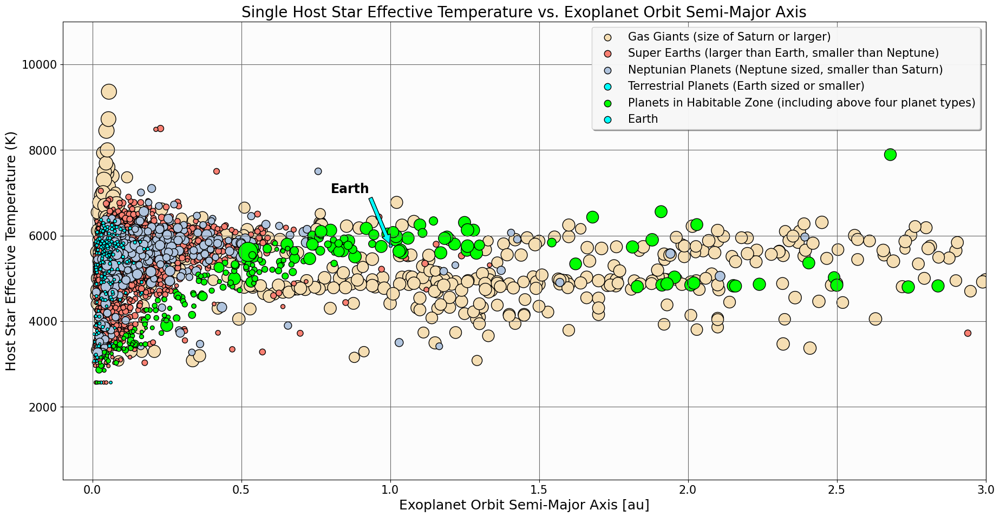

In [246]:
fig = plt.figure(figsize=(22,11))
ax = fig.add_subplot(111, facecolor='0.99')

ax.set_xlim(-0.1, 3)
ax.set_ylim(300, 11000)
ax.grid(color='0.4')
ax.set_title('Single Host Star Effective Temperature vs. Exoplanet Orbit Semi-Major Axis')
ax.title.set_fontsize(20)
ax.set_xlabel('Exoplanet Orbit Semi-Major Axis [au]')
ax.xaxis.label.set_fontsize(18)
ax.set_ylabel('Host Star Effective Temperature (K)')
ax.yaxis.label.set_fontsize(18)

plot_exoplanets_with_size_and_label(ax=ax,
                                    exoplanets_data=st_teff_vs_pl_orb_plot_data_with_earth,
                                    x_field='pl_orbsmax',
                                    y_field='st_teff',
                                    size_field='pl_rade',
                                    type_field='pl_type',
                                    hz_status_field='pl_hz_status',
                                    scale_size=20,
                                    edgecolors='black',
                                    exoplanet_color_map=exoplanet_type_with_hz_colors_with_earth,
                                    exoplanet_label_map=exoplanet_type_with_hz_labels_with_earth)

ax.annotate('Earth', xy=(1, 5780), xytext=(0.8, 7000),
            fontsize=17, fontweight='bold',
            arrowprops=dict(facecolor='cyan', width=5, headwidth=12, shrink=0.02))

ax.tick_params(axis='both', labelsize=15)

legend = ax.legend(scatterpoints=1,
                   labelcolor='black',
                   loc='best',
                   fontsize=15,
                   markerscale=2,
                   shadow=True,
                   framealpha=0.95)
set_legend_size(legend, len(exoplanet_type_with_hz_labels_with_earth), 80)

frame = legend.get_frame()
frame.set_facecolor('0.99')

In [247]:
st_teff_vs_pl_orbeccen_plot_data = exoplanets_data.loc[(~np.isnan(exoplanets_data['sy_snum'])) & (exoplanets_data['sy_snum'] == 1)
                                                       & (~np.isnan(exoplanets_data['st_teff']))
                                                       & (~np.isnan(exoplanets_data['pl_orbeccen']))
                                                       & (~np.isnan(exoplanets_data['pl_rade']))
                                                       & (exoplanets_data['pl_type'] != 'N/A')
                                                       & (exoplanets_data['pl_hz_status'] != 'N/A')]

In [248]:
st_teff_vs_pl_orbeccen_plot_data.describe()

,sy_snum,sy_pnum,disc_year,pl_controv_flag,pl_orbper,pl_orbpererr1,pl_orbpererr2,pl_orbperlim,pl_orbsmax,pl_orbsmaxerr1,...,sy_vmagerr2,sy_kmag,sy_kmagerr1,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2,raw_data_calc_orb_sma,pl_tsurf_k,pl_tsurf_c
count,4262.0,4262.000000,4262.000000,4262.0,4259.000000,3803.000000,3803.000000,4259.000000,4262.000000,1764.000000,...,4257.000000,4257.000000,4234.000000,4226.000000,4232.000000,4231.000000,4231.000000,4262.000000,4262.000000,4262.000000
mean,1.0,1.789770,2015.979118,0.0,463.713249,109.610303,-64.305567,-0.000704,0.658047,0.228187,...,-0.104355,10.784431,0.041339,-0.041382,12.616995,0.000559,-0.000559,0.573921,885.339451,612.189451
std,0.0,1.143498,4.211693,0.0,2915.951068,1159.578851,595.022063,0.026534,4.463319,3.047167,...,0.119235,3.010212,0.258967,0.259210,2.996668,0.001007,0.001007,1.980023,482.394310,482.394310
min,1.0,1.000000,1995.000000,0.0,0.179719,0.000000,-13000.000000,-1.000000,0.005800,0.000000,...,-1.133000,-1.846000,0.011000,-9.995000,2.364310,0.000118,-0.017417,0.000000,34.887329,-238.262671
25%,1.0,1.000000,2014.000000,0.0,4.630353,0.000014,-0.001000,0.000000,0.053000,0.000800,...,-0.126000,9.056000,0.020000,-0.034000,10.922375,0.000256,-0.000519,0.053198,530.585364,257.435364
50%,1.0,1.000000,2016.000000,0.0,12.124009,0.000080,-0.000080,0.000000,0.099700,0.002300,...,-0.080000,11.987000,0.024000,-0.024000,13.702300,0.000357,-0.000357,0.099593,825.151324,552.001324
75%,1.0,2.000000,2019.000000,0.0,42.389314,0.001000,-0.000014,0.000000,0.235825,0.020000,...,-0.030000,13.077000,0.034000,-0.020000,14.951550,0.000519,-0.000256,0.235556,1164.565235,891.415235
max,1.0,8.000000,2024.000000,0.0,77114.071580,40000.000000,0.000000,0.000000,242.400000,114.500000,...,-0.001000,15.376000,9.995000,-0.011000,19.879000,0.017417,-0.000118,37.688047,3034.001396,2760.851396


In [249]:
st_teff_vs_pl_orbeccen_plot_data['pl_hz_status'].value_counts()

,count
pl_hz_status,
Too Hot,3691
Too Cold,354
In HZ,217


In [250]:
st_teff_vs_pl_orbeccen_plot_data.loc[(st_teff_vs_pl_orbeccen_plot_data['pl_hz_status'] == 'In HZ'), 'pl_type'] = 'HabitableZone-Planets'

In [251]:
st_teff_vs_pl_orbeccen_plot_data['pl_type'].value_counts()

,count
pl_type,
Super-Earths,2513
Gas-Giants,1038
Neptunian-Planets,324
HabitableZone-Planets,217
Terrestrial-Planets,170


In [252]:
st_teff_vs_pl_orbeccen_plot_data['st_teff'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,st_teff
count,4262.000000
mean,5406.570087
std,895.151998
min,2566.000000
25%,4997.000000
50%,5588.000000
75%,5906.000000
90%,6166.000000
95%,6310.950000
99%,6763.730000


In [253]:
st_teff_vs_pl_orbeccen_plot_data['pl_orbeccen'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,pl_orbeccen
count,4262.000000
mean,0.067416
std,0.141392
min,0.000000
25%,0.000000
50%,0.000000
75%,0.070000
90%,0.230900
95%,0.390000
99%,0.680000


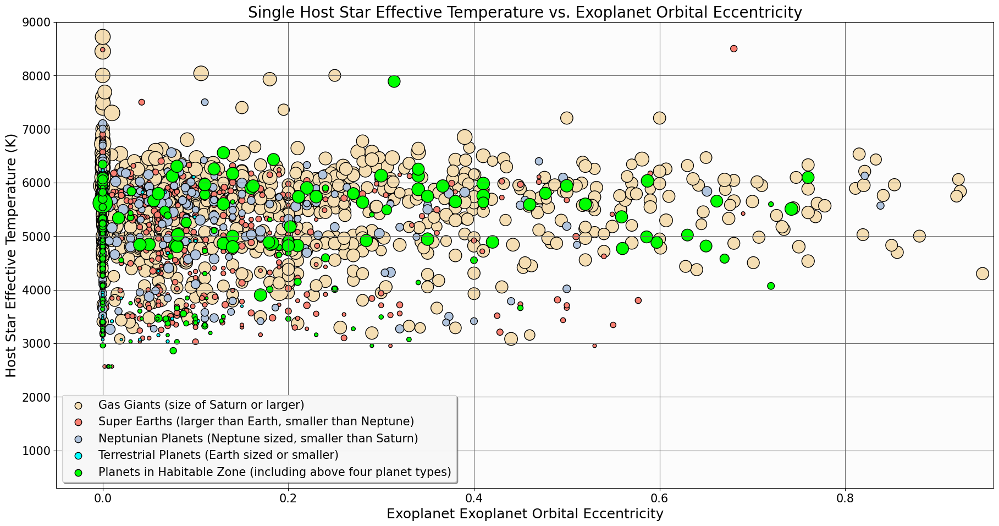

In [255]:
fig = plt.figure(figsize=(22,11))
ax = fig.add_subplot(111, facecolor='0.99')

ax.set_xlim(-0.05, 0.96)
ax.set_ylim(300, 9000)
ax.grid(color='0.4')
ax.set_title('Single Host Star Effective Temperature vs. Exoplanet Orbital Eccentricity')
ax.title.set_fontsize(20)
ax.set_xlabel('Exoplanet Exoplanet Orbital Eccentricity')
ax.xaxis.label.set_fontsize(18)
ax.set_ylabel('Host Star Effective Temperature (K)')
ax.yaxis.label.set_fontsize(18)

plot_exoplanets_with_size_and_label(ax=ax,
                                    exoplanets_data=st_teff_vs_pl_orbeccen_plot_data,
                                    x_field='pl_orbeccen',
                                    y_field='st_teff',
                                    size_field='pl_rade',
                                    type_field='pl_type',
                                    hz_status_field='pl_hz_status',
                                    scale_size=20,
                                    edgecolors='black',
                                    exoplanet_color_map=exoplanet_type_with_hz_colors,
                                    exoplanet_label_map=exoplanet_type_with_hz_labels)

ax.tick_params(axis='both', labelsize=15)

legend = ax.legend(scatterpoints=1,
                   labelcolor='black',
                   loc='best',
                   fontsize=15,
                   markerscale=2,
                   shadow=True,
                   framealpha=0.95)
set_legend_size(legend, len(exoplanet_type_with_hz_labels), 80)

frame = legend.get_frame()
frame.set_facecolor('0.99')

In [256]:
st_teff_vs_pl_orbeccen_plot_data_with_earth = pd.concat([st_teff_vs_pl_orbeccen_plot_data, earth_data], ignore_index=True)
st_teff_vs_pl_orbeccen_plot_data_with_earth.describe()

,sy_snum,sy_pnum,disc_year,pl_controv_flag,pl_orbper,pl_orbpererr1,pl_orbpererr2,pl_orbperlim,pl_orbsmax,pl_orbsmaxerr1,...,sy_vmagerr2,sy_kmag,sy_kmagerr1,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2,raw_data_calc_orb_sma,pl_tsurf_k,pl_tsurf_c
count,4270.0,4270.000000,4270.000000,4270.0,4267.000000,3811.000000,3811.000000,4267.000000,4270.000000,1772.000000,...,4265.000000,4265.000000,4242.000000,4234.000000,4240.000000,4239.000000,4239.000000,4270.000000,4270.000000,4270.000000
mean,1.0,1.801405,2012.202108,0.0,462.843855,109.380210,-64.170577,-0.000703,0.672665,0.227157,...,-0.104159,10.764202,0.041261,-0.041304,12.593189,0.000558,-0.000558,0.572846,884.068429,610.918429
std,0.0,1.173574,87.290280,0.0,2913.284733,1158.371672,594.404328,0.026509,4.493383,3.040315,...,0.119209,3.043382,0.258729,0.258971,3.043506,0.001006,0.001006,1.978323,482.871380,482.871380
min,1.0,1.000000,0.000000,0.0,0.000000,0.000000,-13000.000000,-1.000000,0.005800,0.000000,...,-1.133000,-1.846000,0.000000,-9.995000,0.000000,0.000000,-0.017417,0.000000,34.887329,-238.262671
25%,1.0,1.000000,2014.000000,0.0,4.612473,0.000014,-0.001000,0.000000,0.053125,0.000800,...,-0.126000,9.030000,0.020000,-0.034000,10.907200,0.000255,-0.000519,0.052829,528.408723,255.258723
50%,1.0,1.000000,2016.000000,0.0,12.071725,0.000079,-0.000079,0.000000,0.100000,0.002300,...,-0.080000,11.980000,0.024000,-0.024000,13.688250,0.000357,-0.000357,0.099369,824.160857,551.010857
75%,1.0,2.000000,2019.000000,0.0,42.319798,0.000981,-0.000014,0.000000,0.237000,0.020000,...,-0.030000,13.075000,0.034000,-0.020000,14.951500,0.000519,-0.000255,0.234922,1164.062641,890.912641
max,1.0,8.000000,2024.000000,0.0,77114.071580,40000.000000,0.000000,0.000000,242.400000,114.500000,...,0.000000,15.376000,9.995000,0.000000,19.879000,0.017417,0.000000,37.688047,3034.001396,2760.851396


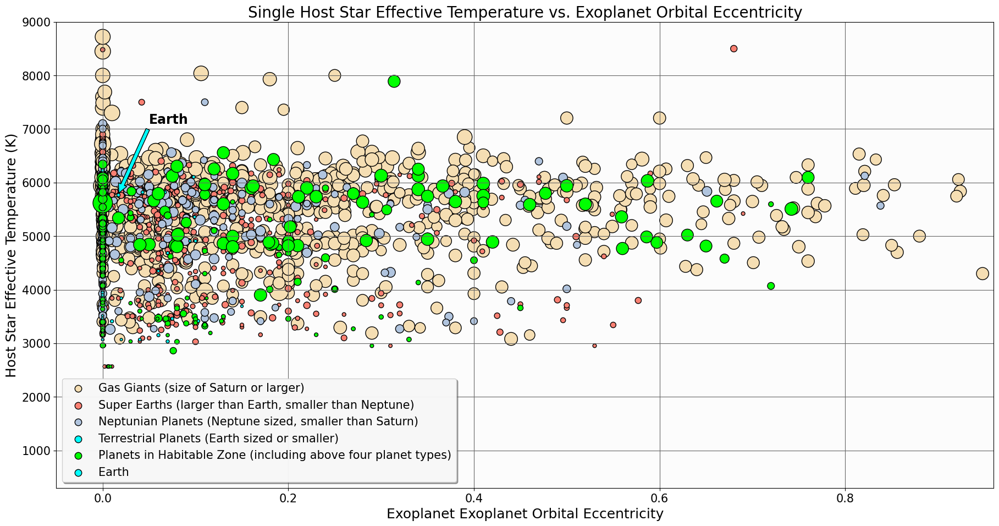

In [258]:
fig = plt.figure(figsize=(22,11))
ax = fig.add_subplot(111, facecolor='0.99')

ax.set_xlim(-0.05, 0.96)
ax.set_ylim(300, 9000)
ax.grid(color='0.4')
ax.set_title('Single Host Star Effective Temperature vs. Exoplanet Orbital Eccentricity')
ax.title.set_fontsize(20)
ax.set_xlabel('Exoplanet Exoplanet Orbital Eccentricity')
ax.xaxis.label.set_fontsize(18)
ax.set_ylabel('Host Star Effective Temperature (K)')
ax.yaxis.label.set_fontsize(18)

plot_exoplanets_with_size_and_label(ax=ax,
                                    exoplanets_data=st_teff_vs_pl_orbeccen_plot_data_with_earth,
                                    x_field='pl_orbeccen',
                                    y_field='st_teff',
                                    size_field='pl_rade',
                                    type_field='pl_type',
                                    hz_status_field='pl_hz_status',
                                    scale_size=20,
                                    edgecolors='black',
                                    exoplanet_color_map=exoplanet_type_with_hz_colors_with_earth,
                                    exoplanet_label_map=exoplanet_type_with_hz_labels_with_earth)

ax.annotate('Earth', xy=(0.0167, 5780), xytext=(0.05, 7100),
            fontsize=17, fontweight='bold',
            arrowprops=dict(facecolor='cyan', width=5, headwidth=12, shrink=0.02))

ax.tick_params(axis='both', labelsize=15)

legend = ax.legend(scatterpoints=1,
                   labelcolor='black',
                   loc='best',
                   fontsize=15,
                   markerscale=2,
                   shadow=True,
                   framealpha=0.95)
set_legend_size(legend, len(exoplanet_type_with_hz_labels_with_earth), 80)

frame = legend.get_frame()
frame.set_facecolor('0.99')

<Axes: xlabel='pl_orbeccen', ylabel='Proportion'>

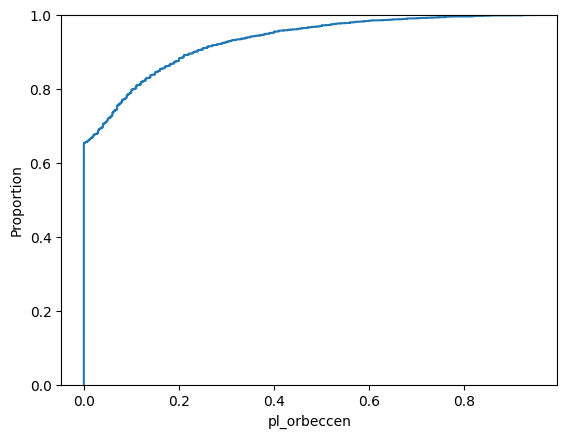

In [259]:
sns.ecdfplot(data=st_teff_vs_pl_orbeccen_plot_data, x="pl_orbeccen")

In [260]:
st_teff_vs_hz_pl_orbeccen_data = st_teff_vs_pl_orbeccen_plot_data.loc[st_teff_vs_pl_orbeccen_plot_data['pl_hz_status'] == 'In HZ']

<Axes: xlabel='pl_orbeccen', ylabel='Proportion'>

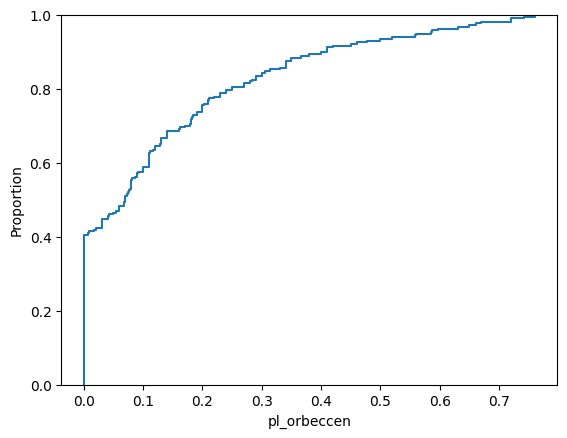

In [261]:
sns.ecdfplot(data=st_teff_vs_hz_pl_orbeccen_data, x="pl_orbeccen")

In [262]:
exoplanet_host_star_ages_filename = '/content/drive/My Drive/Colab Notebooks/HZExoplanetExploration/PlanetarySystemsCompositeData/PSCompPars_2024.07.16.csv'
exoplanet_host_star_ages_data = pd.read_table(exoplanet_host_star_ages_filename,
                                              skiprows=9,
                                              sep=',',
                                              header=None,
                                              index_col=None,
                                              names = ['pl_name', 'st_age'],
                                              skipfooter=0,
                                              engine='python')

In [263]:
exoplanet_host_star_ages_data.head()

,pl_name,st_age
0,11 Com b,NaN
1,11 UMi b,1.56
2,14 And b,4.50
3,14 Her b,3.90
4,16 Cyg B b,7.40


In [264]:
exoplanet_host_star_ages_data.tail()

,pl_name,st_age
5685,ups And b,5.0
5686,ups And c,5.0
5687,ups And d,5.0
5688,ups Leo b,NaN
5689,xi Aql b,7.1


In [ ]:
exoplanet_host_star_ages_data.describe()

,st_age
count,4443.000000
mean,4.377490
std,3.092901
min,0.000000
25%,2.340000
50%,3.980000
75%,5.400000
max,14.900000


In [265]:
# Cast values to corresponding data types
exoplanet_host_star_ages_data['pl_name'] = exoplanet_host_star_ages_data['pl_name'].astype(str)
pd.to_numeric(exoplanet_host_star_ages_data['st_age'], errors = "coerce")

,st_age
0,NaN
1,1.560
2,4.500
3,3.900
4,7.400
5,5.130
6,1.100
7,0.005
8,6.920
9,2.700


In [266]:
exoplanet_host_star_ages_data = exoplanet_host_star_ages_data.applymap(lambda x: np.nan if isinstance(x, str) and x.isspace() else x)

<ipython-input-266-3d73ead346ca>:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  exoplanet_host_star_ages_data = exoplanet_host_star_ages_data.applymap(lambda x: np.nan if isinstance(x, str) and x.isspace() else x)


In [267]:
exoplanets_data_with_host_star_ages = pd.merge(exoplanets_data, exoplanet_host_star_ages_data, on="pl_name")

In [268]:
exoplanets_data_with_host_star_ages.describe()

,sy_snum,sy_pnum,disc_year,pl_controv_flag,pl_orbper,pl_orbpererr1,pl_orbpererr2,pl_orbperlim,pl_orbsmax,pl_orbsmaxerr1,...,sy_kmag,sy_kmagerr1,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2,raw_data_calc_orb_sma,pl_tsurf_k,pl_tsurf_c,st_age
count,5553.000000,5553.000000,5553.000000,5553.0,5.308000e+03,4.832000e+03,4.832000e+03,5308.000000,5262.000000,2667.000000,...,5339.000000,5309.000000,5297.000000,5284.000000,5282.000000,5282.000000,5553.000000,5029.000000,5029.000000,4364.000000
mean,1.101026,1.776517,2016.189447,0.0,8.055731e+04,9.903868e+04,-2.261647e+04,-0.000754,6.664429,2.414948,...,10.514391,0.043193,-0.043217,12.361819,0.000626,-0.000626,2.142603,878.237665,605.087665,4.377250
std,0.339075,1.156648,4.526433,0.0,5.520307e+06,6.761695e+06,1.440733e+06,0.038818,134.737148,100.927028,...,3.031605,0.265394,0.271613,2.994687,0.001679,0.001679,103.053939,500.326476,500.326476,3.082498
min,1.000000,1.000000,1992.000000,0.0,9.070629e-02,0.000000e+00,-1.000000e+08,-1.000000,0.004400,0.000000,...,-3.044000,0.011000,-9.995000,2.364310,0.000118,-0.063232,0.000000,1.221287,-271.928713,0.000000
25%,1.000000,1.000000,2014.000000,0.0,4.464757e+00,1.500000e-05,-1.600000e-03,0.000000,0.053100,0.000810,...,8.598000,0.020000,-0.031000,10.574500,0.000257,-0.000536,0.048373,510.312824,237.162824,2.340000
50%,1.000000,1.000000,2016.000000,0.0,1.155316e+01,1.000000e-04,-1.000000e-04,0.000000,0.103050,0.002800,...,11.436000,0.023000,-0.023000,13.239650,0.000364,-0.000364,0.090328,812.326419,539.176419,3.980000
75%,1.000000,2.000000,2020.000000,0.0,4.124118e+01,1.600000e-03,-1.500000e-05,0.000000,0.300000,0.037500,...,12.847500,0.031000,-0.020000,14.770000,0.000536,-0.000257,0.214142,1163.349974,890.199974,5.400000
max,4.000000,8.000000,2024.000000,0.0,4.020000e+08,4.700000e+08,0.000000e+00,1.000000,7506.000000,5205.000000,...,33.110000,9.995000,-0.011000,20.186100,0.063232,-0.000118,7652.883408,4176.941844,3903.791844,14.900000


,count
pl_type,
N/A,14
Terrestrial-Planets,212
Neptunian-Planets,484
Gas-Giants,1608
Super-Earths,3235


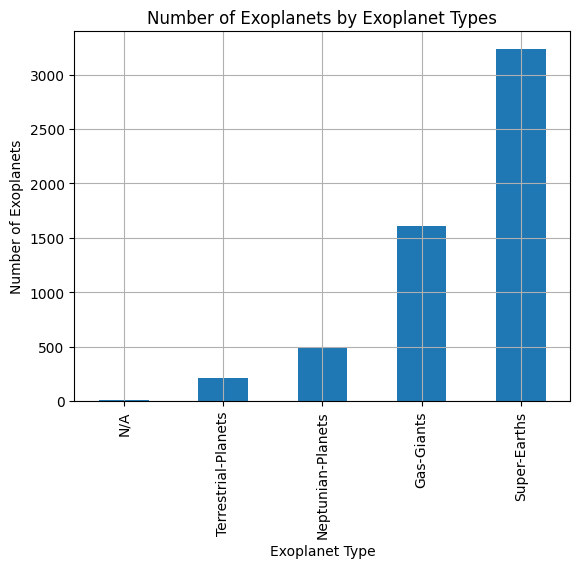

In [269]:
# Plot the graph for the number of exoplanets by exoplanet classes
exoplanet_types = exoplanets_data_with_host_star_ages['pl_type'].map(lambda x: x)
exoplanet_types.value_counts().sort_values().plot(kind='bar',
                                                  xlabel='Exoplanet Type',
                                                  ylabel='Number of Exoplanets',
                                                  title='Number of Exoplanets by Exoplanet Types',
                                                  grid=True)
exoplanet_types.value_counts().sort_values()

,count
st_spectype,
B,7
A,21
F,248
M,434
K,568
G,711


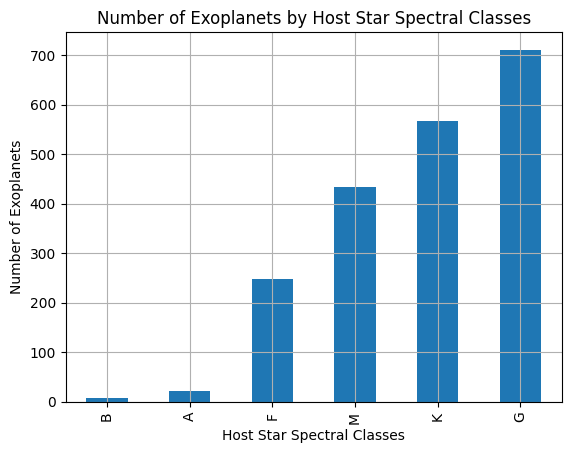

In [270]:
# Keep the stellar hosts with OBAFGKM spectral classes
exoplanets_with_spectypes = exoplanets_data_with_host_star_ages[exoplanets_data_with_host_star_ages['st_spectype'].map(lambda x: x[0].upper() in 'OBAFGKM')]

# Plot the graph for the number of stellar hosts by spectral classes
stellar_host_spectral_classes = exoplanets_with_spectypes['st_spectype'].map(lambda x: x[0].upper())
stellar_host_spectral_classes.value_counts().sort_values().plot(kind='bar',
                                                                xlabel='Host Star Spectral Classes',
                                                                ylabel='Number of Exoplanets',
                                                                title='Number of Exoplanets by Host Star Spectral Classes',
                                                                grid=True)
stellar_host_spectral_classes.value_counts().sort_values()

In [271]:
exoplanets_data_with_host_star_ages['st_age'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,st_age
count,4364.000000
mean,4.377250
std,3.082498
min,0.000000
25%,2.340000
50%,3.980000
75%,5.400000
90%,8.500000
95%,11.000000
99%,13.900000


,count
st_age,
"(0, 1]",551
"(1, 2]",382
"(2, 3]",550
"(3, 4]",752
"(4, 5]",913
"(5, 6]",293
"(6, 7]",228
"(7, 8]",196
"(8, 9]",129


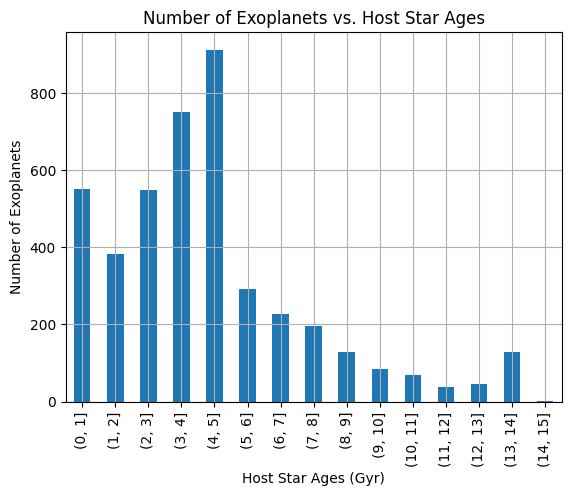

In [272]:
host_star_age_buckets = create_buckets(0, 15, 1)
host_star_ages_dist = pd.cut(exoplanets_data_with_host_star_ages['st_age'], bins=host_star_age_buckets)
host_star_ages_dist.value_counts().sort_index().plot(kind='bar',
                                                     xlabel='Host Star Ages (Gyr)',
                                                     ylabel='Number of Exoplanets',
                                                     title='Number of Exoplanets vs. Host Star Ages',
                                                     grid=True)
host_star_ages_dist.value_counts().sort_index()

<Axes: xlabel='st_age', ylabel='Proportion'>

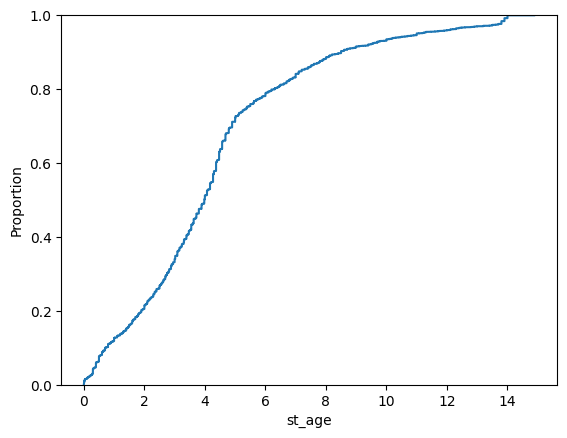

In [273]:
sns.ecdfplot(data=exoplanets_data_with_host_star_ages, x="st_age")

,count
st_age,
"(0, 1]",23
"(1, 2]",18
"(2, 3]",25
"(3, 4]",32
"(4, 5]",42
"(5, 6]",11
"(6, 7]",13
"(7, 8]",10
"(8, 9]",8


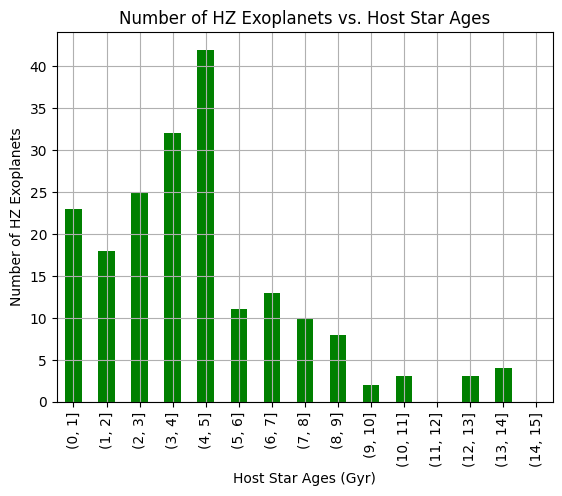

In [274]:
hz_exoplanets_data = exoplanets_data_with_host_star_ages.loc[(exoplanets_data_with_host_star_ages['pl_hz_status'] == 'In HZ')]
hz_host_star_ages_dist = pd.cut(hz_exoplanets_data['st_age'], bins=host_star_age_buckets)
hz_host_star_ages_dist.value_counts().sort_index().plot(kind='bar',
                                                        xlabel='Host Star Ages (Gyr)',
                                                        ylabel='Number of HZ Exoplanets',
                                                        title='Number of HZ Exoplanets vs. Host Star Ages',
                                                        color='green',
                                                        grid=True)
hz_host_star_ages_dist.value_counts().sort_index()

<Axes: xlabel='st_age', ylabel='Proportion'>

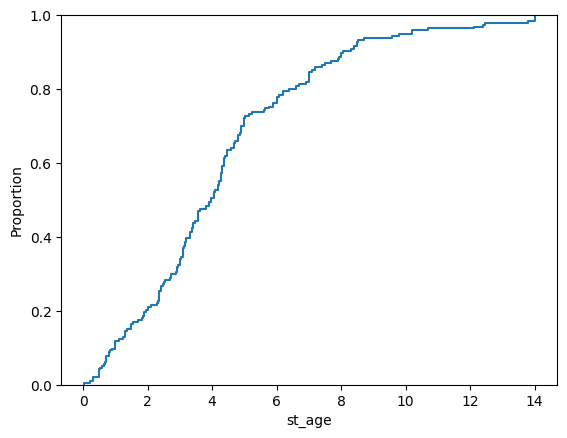

In [275]:
sns.ecdfplot(data=hz_exoplanets_data, x="st_age")

,count
st_age,
"(0.0, 0.1]",73
"(0.1, 0.2]",28
"(0.2, 0.3]",84
"(0.3, 0.4]",73
"(0.4, 0.5]",76
"(0.5, 0.6]",47
"(0.6, 0.7]",55
"(0.7, 0.8]",12
"(0.8, 0.9]",44


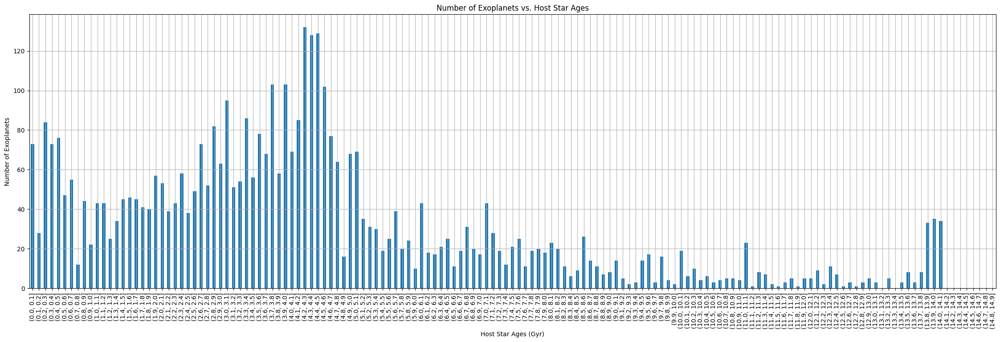

In [276]:
host_star_age_buckets = create_buckets(0, 14.9, 0.1)
host_star_ages_dist = pd.cut(exoplanets_data_with_host_star_ages['st_age'], bins=host_star_age_buckets)
host_star_ages_dist.value_counts().sort_index().plot(kind='bar',
                                                     figsize=(28, 8),
                                                     xlabel='Host Star Ages (Gyr)',
                                                     ylabel='Number of Exoplanets',
                                                     title='Number of Exoplanets vs. Host Star Ages',
                                                     grid=True)
host_star_ages_dist.value_counts().sort_index()

,count
st_age,
"(0.0, 0.1]",1
"(0.1, 0.2]",1
"(0.2, 0.3]",2
"(0.3, 0.4]",0
"(0.4, 0.5]",4
"(0.5, 0.6]",2
"(0.6, 0.7]",5
"(0.7, 0.8]",0
"(0.8, 0.9]",3


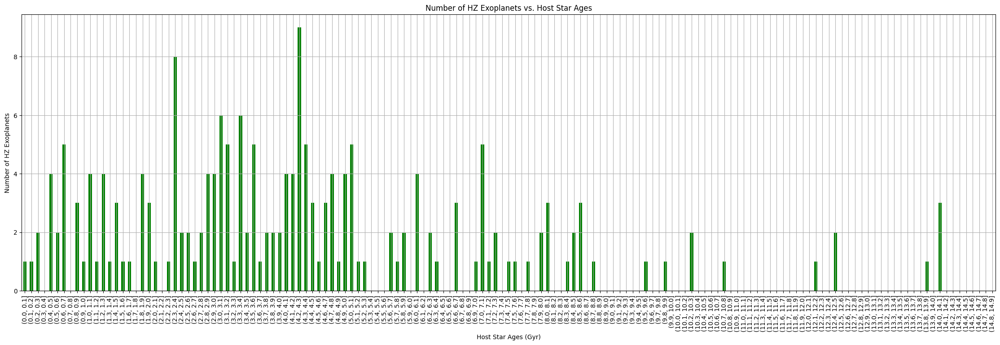

In [277]:
hz_exoplanets_data = exoplanets_data_with_host_star_ages.loc[(exoplanets_data_with_host_star_ages['pl_hz_status'] == 'In HZ')]
hz_host_star_ages_dist = pd.cut(hz_exoplanets_data['st_age'], bins=host_star_age_buckets)
hz_host_star_ages_dist.value_counts().sort_index().plot(kind='bar',
                                                        figsize=(28, 8),
                                                        xlabel='Host Star Ages (Gyr)',
                                                        ylabel='Number of HZ Exoplanets',
                                                        title='Number of HZ Exoplanets vs. Host Star Ages',
                                                        color='green',
                                                        grid=True)
hz_host_star_ages_dist.value_counts().sort_index()

In [278]:
exoplanets_data_with_host_star_ages['pl_orbeccen'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,pl_orbeccen
count,4788.000000
mean,0.076041
std,0.150117
min,0.000000
25%,0.000000
50%,0.000000
75%,0.089250
90%,0.260000
95%,0.400000
99%,0.720780


,count
pl_orbeccen,
"(0.0, 0.1]",766
"(0.1, 0.2]",446
"(0.2, 0.3]",243
"(0.3, 0.4]",157
"(0.4, 0.5]",85
"(0.5, 0.6]",65
"(0.6, 0.7]",34
"(0.7, 0.8]",27
"(0.8, 0.9]",20


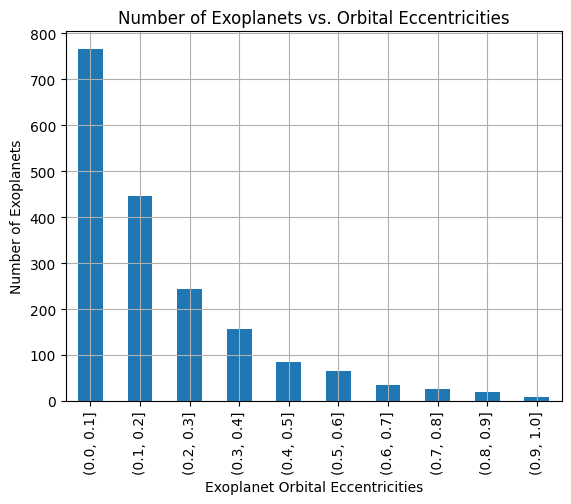

In [279]:
exoplanet_eccentricity_buckets = create_buckets(0, 1, 0.1)
exoplanet_eccentricities_dist = pd.cut(exoplanets_data_with_host_star_ages['pl_orbeccen'], bins=exoplanet_eccentricity_buckets)
exoplanet_eccentricities_dist.value_counts().sort_index().plot(kind='bar',
                                                               xlabel='Exoplanet Orbital Eccentricities',
                                                               ylabel='Number of Exoplanets',
                                                               title='Number of Exoplanets vs. Orbital Eccentricities',
                                                               grid=True)
exoplanet_eccentricities_dist.value_counts().sort_index()

,count
pl_orbeccen,
"(0.0, 0.1]",51
"(0.1, 0.2]",45
"(0.2, 0.3]",21
"(0.3, 0.4]",14
"(0.4, 0.5]",9
"(0.5, 0.6]",6
"(0.6, 0.7]",5
"(0.7, 0.8]",4
"(0.8, 0.9]",0


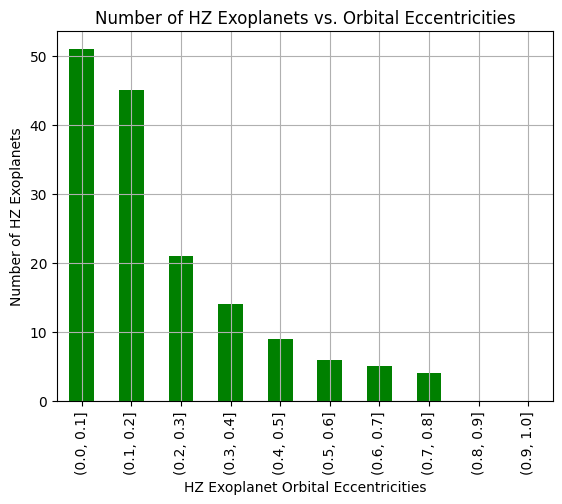

In [280]:
hz_exoplanets_data = exoplanets_data_with_host_star_ages.loc[(exoplanets_data_with_host_star_ages['pl_hz_status'] == 'In HZ')]
hz_exoplanet_eccentricities_dist = pd.cut(hz_exoplanets_data['pl_orbeccen'], bins=exoplanet_eccentricity_buckets)
hz_exoplanet_eccentricities_dist.value_counts().sort_index().plot(kind='bar',
                                                                  xlabel='HZ Exoplanet Orbital Eccentricities',
                                                                  ylabel='Number of HZ Exoplanets',
                                                                  title='Number of HZ Exoplanets vs. Orbital Eccentricities',
                                                                  color='green',
                                                                  grid=True)
hz_exoplanet_eccentricities_dist.value_counts().sort_index()

,count
pl_orbeccen,
"(0.0, 0.01]",48
"(0.01, 0.02]",80
"(0.02, 0.03]",68
"(0.03, 0.04]",85
"(0.04, 0.05]",87
"(0.05, 0.06]",79
"(0.06, 0.07]",93
"(0.07, 0.08]",75
"(0.08, 0.09]",70


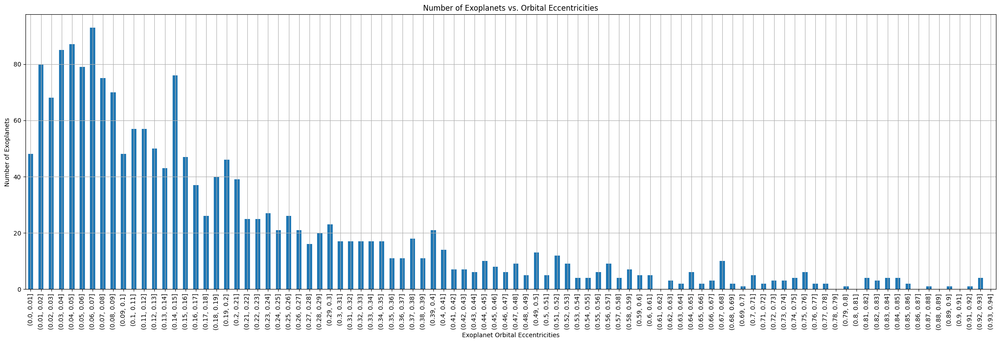

In [281]:
exoplanet_eccentricity_buckets = create_buckets(0, 0.95, 0.01)
exoplanet_eccentricities_dist = pd.cut(exoplanets_data_with_host_star_ages['pl_orbeccen'], bins=exoplanet_eccentricity_buckets)
exoplanet_eccentricities_dist.value_counts().sort_index().plot(kind='bar',
                                                               figsize=(28, 8),
                                                               xlabel='Exoplanet Orbital Eccentricities',
                                                               ylabel='Number of Exoplanets',
                                                               title='Number of Exoplanets vs. Orbital Eccentricities',
                                                               grid=True)
exoplanet_eccentricities_dist.value_counts().sort_index()

,count
pl_orbeccen,
"(0.0, 0.01]",3
"(0.01, 0.02]",2
"(0.02, 0.03]",7
"(0.03, 0.04]",4
"(0.04, 0.05]",4
"(0.05, 0.06]",5
"(0.06, 0.07]",8
"(0.07, 0.08]",10
"(0.08, 0.09]",4


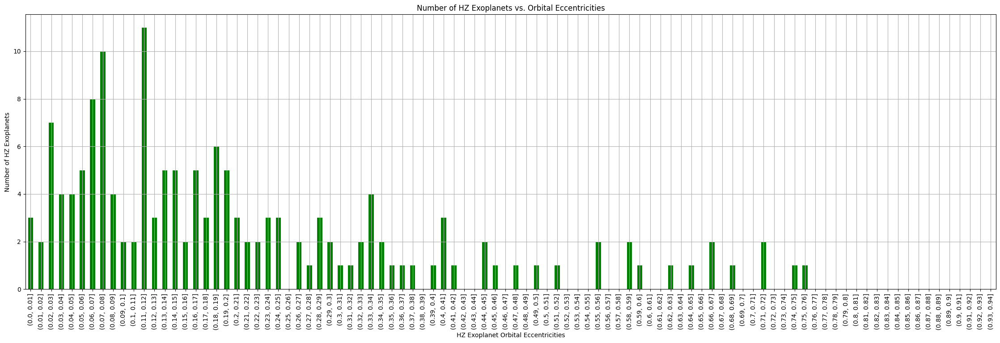

In [282]:
hz_exoplanets_data = exoplanets_data_with_host_star_ages.loc[(exoplanets_data_with_host_star_ages['pl_hz_status'] == 'In HZ')]
hz_exoplanet_eccentricities_dist = pd.cut(hz_exoplanets_data['pl_orbeccen'], bins=exoplanet_eccentricity_buckets)
hz_exoplanet_eccentricities_dist.value_counts().sort_index().plot(kind='bar',
                                                                  figsize=(28, 8),
                                                                  xlabel='HZ Exoplanet Orbital Eccentricities',
                                                                  ylabel='Number of HZ Exoplanets',
                                                                  title='Number of HZ Exoplanets vs. Orbital Eccentricities',
                                                                  color='green',
                                                                  grid=True)
hz_exoplanet_eccentricities_dist.value_counts().sort_index()

In [283]:
exoplanets_data_with_host_star_ages['pl_orbper'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,pl_orbper
count,5.308000e+03
mean,8.055731e+04
std,5.520307e+06
min,9.070629e-02
25%,4.464757e+00
50%,1.155316e+01
75%,4.124118e+01
90%,4.822457e+02
95%,1.591340e+03
99%,1.399636e+04


,count
pl_orbper,
"(0, 20]",3373
"(20, 40]",583
"(40, 60]",246
"(60, 80]",93
"(80, 100]",90
"(100, 120]",50
"(120, 140]",54
"(140, 160]",39
"(160, 180]",21


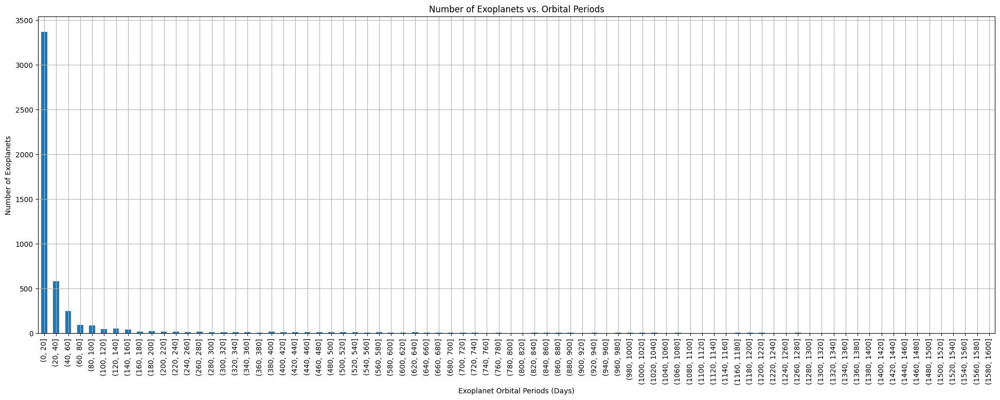

In [284]:
exoplanet_orbit_period_buckets = create_buckets(0, 1600, 20)
exoplanet_orbit_periods_dist = pd.cut(exoplanets_data_with_host_star_ages['pl_orbper'], bins=exoplanet_orbit_period_buckets)
exoplanet_orbit_periods_dist.value_counts().sort_index().plot(kind='bar',
                                                              figsize=(24, 8),
                                                              xlabel='Exoplanet Orbital Periods (Days)',
                                                              ylabel='Number of Exoplanets',
                                                              title='Number of Exoplanets vs. Orbital Periods',
                                                              grid=True)
exoplanet_orbit_periods_dist.value_counts().sort_index()

,count
pl_orbper,
"(0, 20]",3373
"(20, 40]",583
"(40, 60]",246
"(60, 80]",93
"(80, 100]",90
"(100, 120]",50
"(120, 140]",54
"(140, 160]",39
"(160, 180]",21


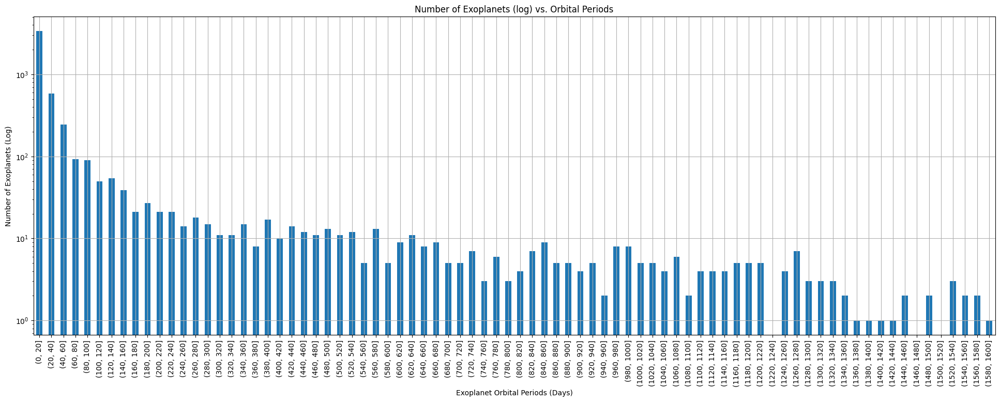

In [285]:
exoplanet_orbit_periods_dist.value_counts().sort_index().plot(kind='bar',
                                                              figsize=(24, 8),
                                                              xlabel='Exoplanet Orbital Periods (Days)',
                                                              ylabel='Number of Exoplanets (Log)',
                                                              title='Number of Exoplanets (log) vs. Orbital Periods',
                                                              grid=True,
                                                              logy=True)
exoplanet_orbit_periods_dist.value_counts().sort_index()

,count
pl_orbper,
"(0, 20]",35
"(20, 40]",25
"(40, 60]",13
"(60, 80]",11
"(80, 100]",14
"(100, 120]",6
"(120, 140]",11
"(140, 160]",14
"(160, 180]",12


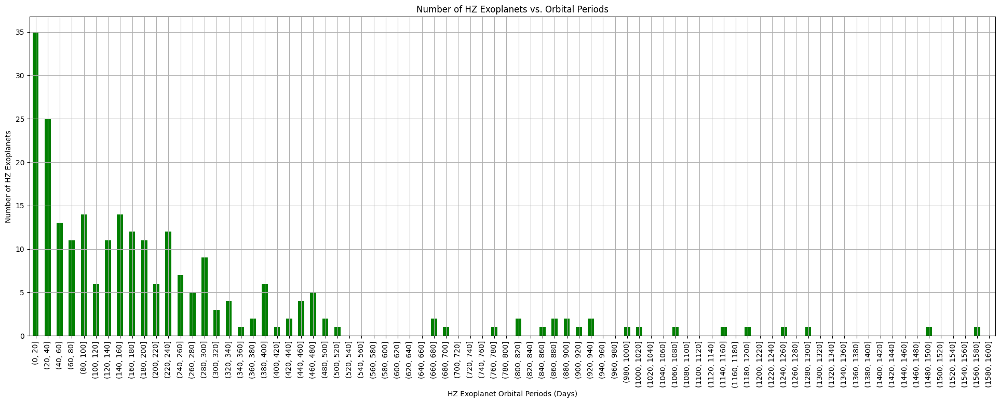

In [286]:
hz_exoplanets_data = exoplanets_data_with_host_star_ages.loc[(exoplanets_data_with_host_star_ages['pl_hz_status'] == 'In HZ')]
hz_exoplanet_orbit_periods_dist = pd.cut(hz_exoplanets_data['pl_orbper'], bins=exoplanet_orbit_period_buckets)
hz_exoplanet_orbit_periods_dist.value_counts().sort_index().plot(kind='bar',
                                                                 figsize=(24, 8),
                                                                 xlabel='HZ Exoplanet Orbital Periods (Days)',
                                                                 ylabel='Number of HZ Exoplanets',
                                                                 title='Number of HZ Exoplanets vs. Orbital Periods',
                                                                 color='green',
                                                                 grid=True)
hz_exoplanet_orbit_periods_dist.value_counts().sort_index()

In [287]:
exoplanets_data_with_host_star_ages['pl_orbsmax'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,pl_orbsmax
count,5262.000000
mean,6.664429
std,134.737148
min,0.004400
25%,0.053100
50%,0.103050
75%,0.300000
90%,1.900000
95%,3.603800
99%,22.518100


,count
pl_orbsmax,
"(0.0, 0.1]",2563
"(0.1, 0.2]",1032
"(0.2, 0.3]",353
"(0.3, 0.4]",164
"(0.4, 0.5]",99
"(0.5, 0.6]",72
"(0.6, 0.7]",53
"(0.7, 0.8]",46
"(0.8, 0.9]",37


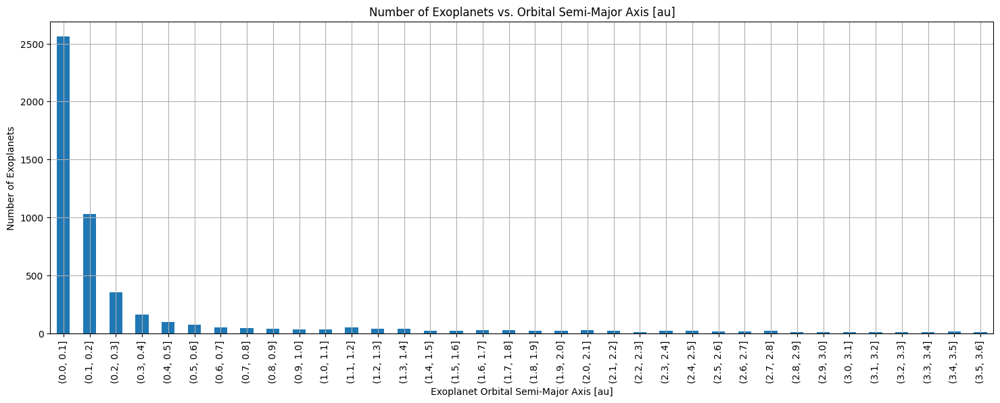

In [288]:
exoplanet_orbit_au_buckets = create_buckets(0, 3.7, 0.1)
exoplanet_orbit_au_dist = pd.cut(exoplanets_data_with_host_star_ages['pl_orbsmax'], bins=exoplanet_orbit_au_buckets)
exoplanet_orbit_au_dist.value_counts().sort_index().plot(kind='bar',
                                                         figsize=(18, 6),
                                                         xlabel='Exoplanet Orbital Semi-Major Axis [au]',
                                                         ylabel='Number of Exoplanets',
                                                         title='Number of Exoplanets vs. Orbital Semi-Major Axis [au]',
                                                         grid=True)
exoplanet_orbit_au_dist.value_counts().sort_index()

,count
pl_orbsmax,
"(0.0, 0.1]",2563
"(0.1, 0.2]",1032
"(0.2, 0.3]",353
"(0.3, 0.4]",164
"(0.4, 0.5]",99
"(0.5, 0.6]",72
"(0.6, 0.7]",53
"(0.7, 0.8]",46
"(0.8, 0.9]",37


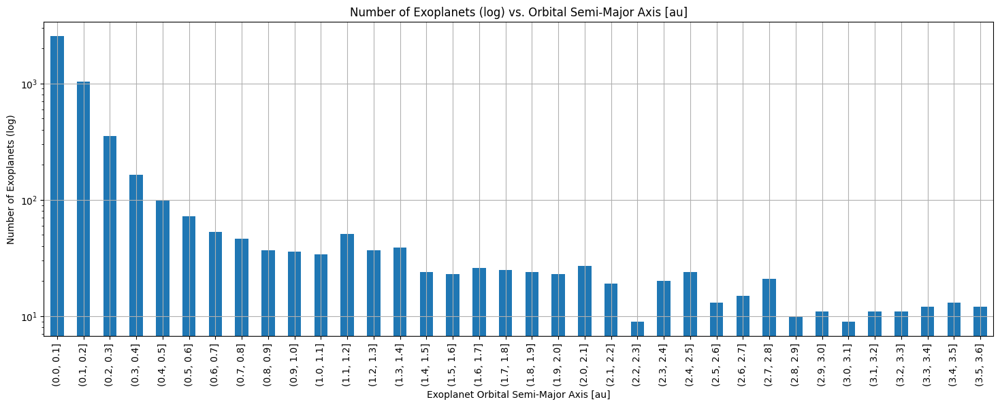

In [289]:
exoplanet_orbit_au_dist.value_counts().sort_index().plot(kind='bar',
                                                         figsize=(18, 6),
                                                         xlabel='Exoplanet Orbital Semi-Major Axis [au]',
                                                         ylabel='Number of Exoplanets (log)',
                                                         title='Number of Exoplanets (log) vs. Orbital Semi-Major Axis [au]',
                                                         grid=True,
                                                         logy=True)
exoplanet_orbit_au_dist.value_counts().sort_index()

,count
pl_orbsmax,
"(0.0, 0.1]",33
"(0.1, 0.2]",28
"(0.2, 0.3]",20
"(0.3, 0.4]",19
"(0.4, 0.5]",17
"(0.5, 0.6]",23
"(0.6, 0.7]",19
"(0.7, 0.8]",16
"(0.8, 0.9]",15


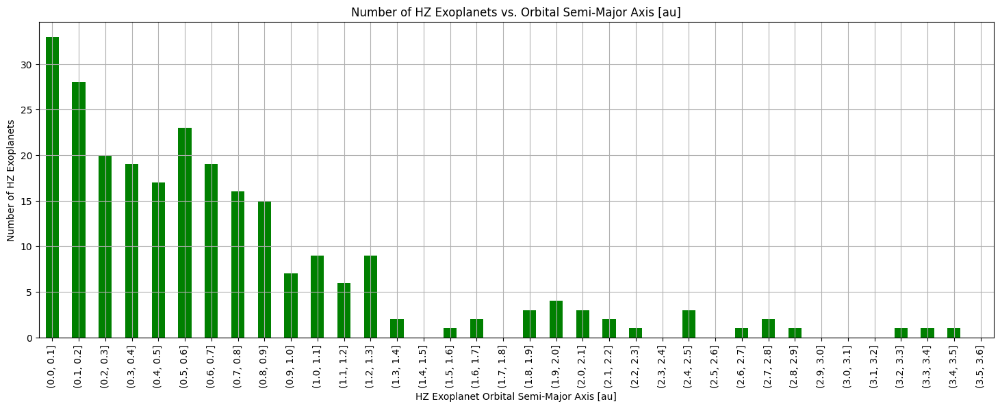

In [290]:
hz_exoplanets_data = exoplanets_data_with_host_star_ages.loc[(exoplanets_data_with_host_star_ages['pl_hz_status'] == 'In HZ')]
hz_exoplanet_orbit_au_dist = pd.cut(hz_exoplanets_data['pl_orbsmax'], bins=exoplanet_orbit_au_buckets)
hz_exoplanet_orbit_au_dist.value_counts().sort_index().plot(kind='bar',
                                                            figsize=(18, 6),
                                                            xlabel='HZ Exoplanet Orbital Semi-Major Axis [au]',
                                                            ylabel='Number of HZ Exoplanets',
                                                            title='Number of HZ Exoplanets vs. Orbital Semi-Major Axis [au]',
                                                            color='green',
                                                            grid=True)
hz_exoplanet_orbit_au_dist.value_counts().sort_index()

In [291]:
exoplanets_data_with_host_star_ages['pl_bmasse'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,pl_bmasse
count,5534.000000
mean,427.818254
std,2269.850403
min,0.020000
25%,4.040000
50%,8.700000
75%,161.933777
90%,908.983660
95%,2218.546597
99%,6078.560456


,count
pl_bmasse,
"(0, 20]",3532
"(20, 40]",229
"(40, 60]",97
"(60, 80]",86
"(80, 100]",60
"(100, 120]",53
"(120, 140]",50
"(140, 160]",41
"(160, 180]",51


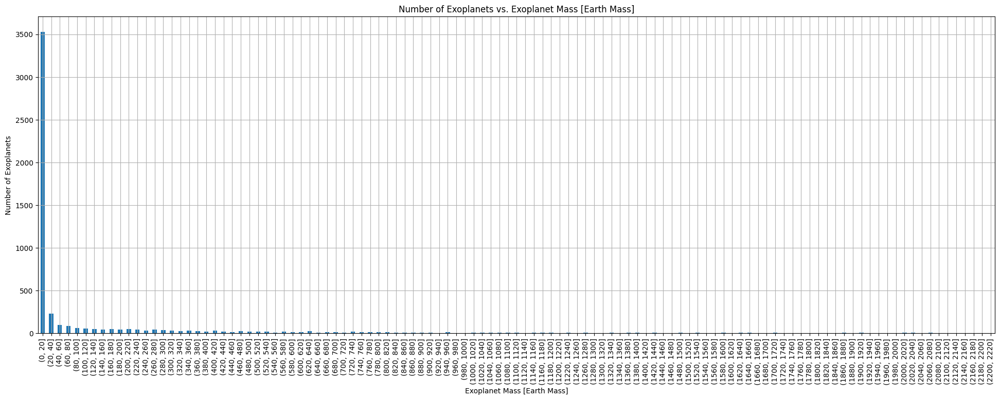

In [292]:
exoplanet_mass_buckets = create_buckets(0, 2230, 20)
exoplanet_mass_dist = pd.cut(exoplanets_data_with_host_star_ages['pl_bmasse'], bins=exoplanet_mass_buckets)
exoplanet_mass_dist.value_counts().sort_index().plot(kind='bar',
                                                         figsize=(24, 8),
                                                         xlabel='Exoplanet Mass [Earth Mass]',
                                                         ylabel='Number of Exoplanets',
                                                         title='Number of Exoplanets vs. Exoplanet Mass [Earth Mass]',
                                                         grid=True)
exoplanet_mass_dist.value_counts().sort_index()

,count
pl_bmasse,
"(0, 20]",3532
"(20, 40]",229
"(40, 60]",97
"(60, 80]",86
"(80, 100]",60
"(100, 120]",53
"(120, 140]",50
"(140, 160]",41
"(160, 180]",51


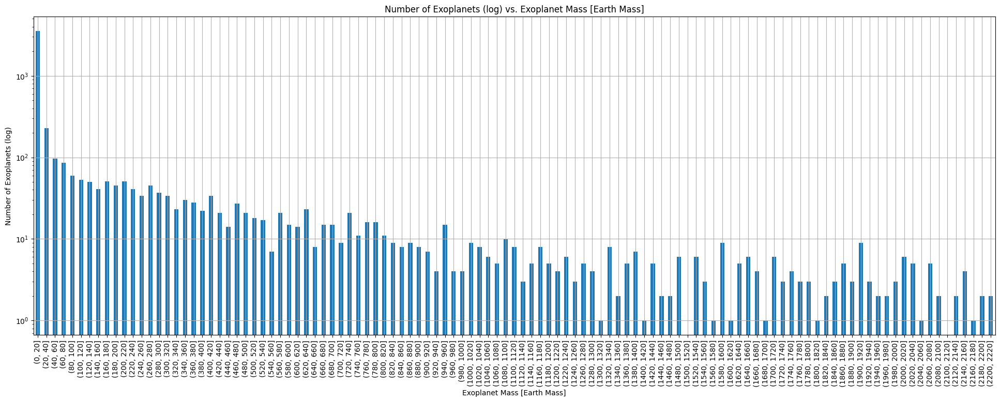

In [293]:
exoplanet_mass_dist.value_counts().sort_index().plot(kind='bar',
                                                     figsize=(24, 8),
                                                     xlabel='Exoplanet Mass [Earth Mass]',
                                                     ylabel='Number of Exoplanets (log)',
                                                     title='Number of Exoplanets (log) vs. Exoplanet Mass [Earth Mass]',
                                                     logy=True,
                                                     grid=True)
exoplanet_mass_dist.value_counts().sort_index()

,count
pl_bmasse,
"(0, 20]",147
"(20, 40]",18
"(40, 60]",9
"(60, 80]",6
"(80, 100]",1
"(100, 120]",2
"(120, 140]",1
"(140, 160]",1
"(160, 180]",2


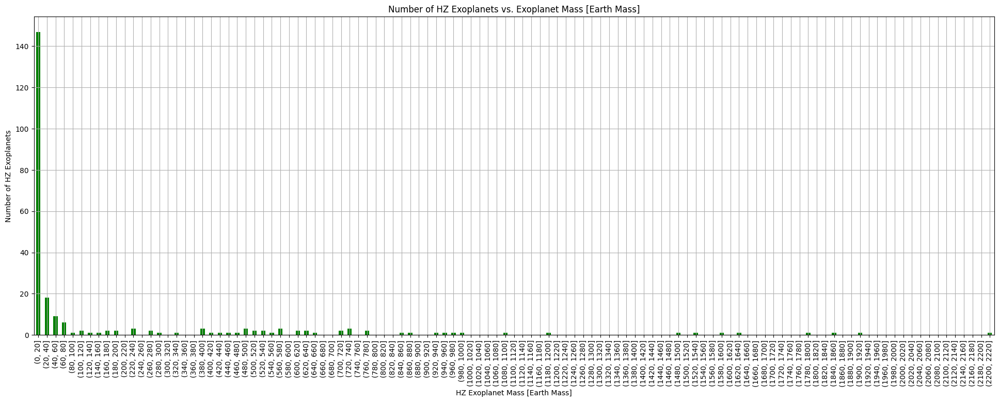

In [294]:
hz_exoplanets_data = exoplanets_data_with_host_star_ages.loc[(exoplanets_data_with_host_star_ages['pl_hz_status'] == 'In HZ')]
hz_exoplanet_mass_dist = pd.cut(hz_exoplanets_data['pl_bmasse'], bins=exoplanet_mass_buckets)
hz_exoplanet_mass_dist.value_counts().sort_index().plot(kind='bar',
                                                        figsize=(24, 8),
                                                        xlabel='HZ Exoplanet Mass [Earth Mass]',
                                                        ylabel='Number of HZ Exoplanets',
                                                        title='Number of HZ Exoplanets vs. Exoplanet Mass [Earth Mass]',
                                                        color='green',
                                                        grid=True)
hz_exoplanet_mass_dist.value_counts().sort_index()

In [295]:
exoplanets_data_with_host_star_ages['st_logg'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,st_logg
count,5312.000000
mean,4.374767
std,0.440982
min,0.540000
25%,4.290000
50%,4.450000
75%,4.570000
90%,4.690000
95%,4.790000
99%,5.050000


,count
st_logg,
"(0.5, 0.6]",1
"(0.6, 0.7]",0
"(0.7, 0.8]",0
"(0.8, 0.9]",1
"(0.9, 1.0]",1
"(1.0, 1.1]",0
"(1.1, 1.2]",2
"(1.2, 1.3]",3
"(1.3, 1.4]",4


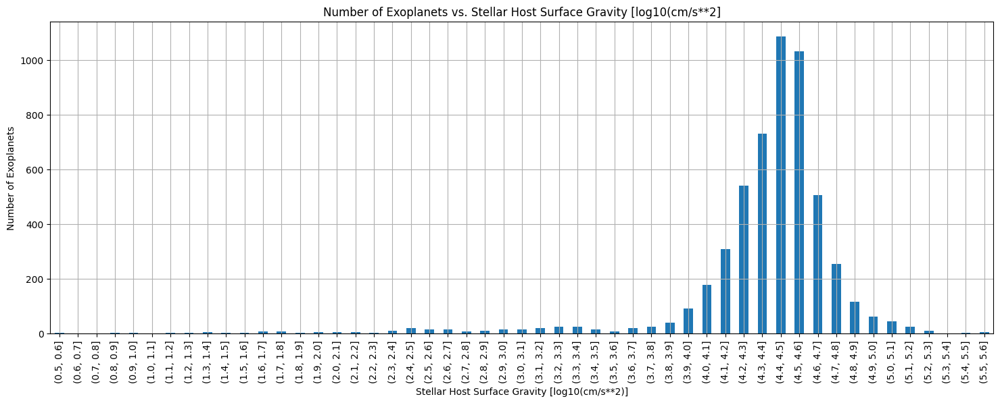

In [296]:
stellar_surface_gravity_buckets = create_buckets(0.50, 5.60, 0.1)
stellar_surface_gravity_dist = pd.cut(exoplanets_data_with_host_star_ages['st_logg'], bins=stellar_surface_gravity_buckets)
stellar_surface_gravity_dist.value_counts().sort_index().plot(kind='bar',
                                                              figsize=(18, 6),
                                                              xlabel='Stellar Host Surface Gravity [log10(cm/s**2)]',
                                                              ylabel='Number of Exoplanets',
                                                              title='Number of Exoplanets vs. Stellar Host Surface Gravity [log10(cm/s**2]',
                                                              grid=True)
stellar_surface_gravity_dist.value_counts().sort_index()

,count
st_logg,
"(0.5, 0.6]",0
"(0.6, 0.7]",0
"(0.7, 0.8]",0
"(0.8, 0.9]",0
"(0.9, 1.0]",0
"(1.0, 1.1]",0
"(1.1, 1.2]",0
"(1.2, 1.3]",0
"(1.3, 1.4]",0


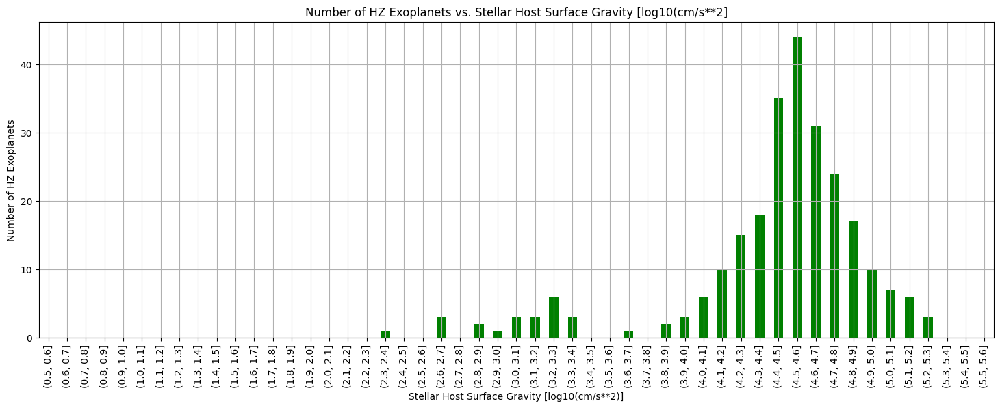

In [297]:
hz_exoplanets_data = exoplanets_data_with_host_star_ages.loc[(exoplanets_data_with_host_star_ages['pl_hz_status'] == 'In HZ')]
stellar_with_hz_exoplanet_surface_gravity_dist = pd.cut(hz_exoplanets_data['st_logg'], bins=stellar_surface_gravity_buckets)
stellar_with_hz_exoplanet_surface_gravity_dist.value_counts().sort_index().plot(kind='bar',
                                                                                figsize=(18, 6),
                                                                                xlabel='Stellar Host Surface Gravity [log10(cm/s**2)]',
                                                                                ylabel='Number of HZ Exoplanets',
                                                                                title='Number of HZ Exoplanets vs. Stellar Host Surface Gravity [log10(cm/s**2]',
                                                                                color='green',
                                                                                grid=True)
stellar_with_hz_exoplanet_surface_gravity_dist.value_counts().sort_index()

In [298]:
exoplanets_data_with_host_star_ages['st_mass'].describe(percentiles=[.25, .5, .75, .90, .95, .99, .995, .999])

,st_mass
count,5551.000000
mean,0.950928
std,0.423251
min,0.010000
25%,0.790000
50%,0.950000
75%,1.090000
90%,1.280000
95%,1.455000
99%,2.065000


,count
st_mass,
"(0.0, 0.1]",45
"(0.1, 0.2]",77
"(0.2, 0.3]",80
"(0.3, 0.4]",112
"(0.4, 0.5]",158
"(0.5, 0.6]",233
"(0.6, 0.7]",302
"(0.7, 0.8]",415
"(0.8, 0.9]",815


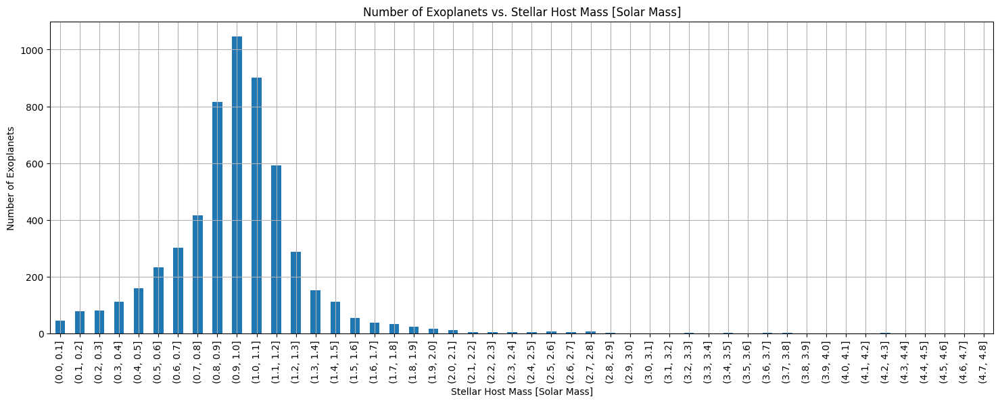

In [299]:
stellar_mass_buckets = create_buckets(0, 4.8, 0.1)
stellar_mass_dist = pd.cut(exoplanets_data_with_host_star_ages['st_mass'], bins=stellar_mass_buckets)
stellar_mass_dist.value_counts().sort_index().plot(kind='bar',
                                                   figsize=(18, 6),
                                                   xlabel='Stellar Host Mass [Solar Mass]',
                                                   ylabel='Number of Exoplanets',
                                                   title='Number of Exoplanets vs. Stellar Host Mass [Solar Mass]',
                                                   grid=True)
stellar_mass_dist.value_counts().sort_index()

,count
st_mass,
"(0.0, 0.1]",3
"(0.1, 0.2]",13
"(0.2, 0.3]",10
"(0.3, 0.4]",10
"(0.4, 0.5]",18
"(0.5, 0.6]",12
"(0.6, 0.7]",23
"(0.7, 0.8]",20
"(0.8, 0.9]",40


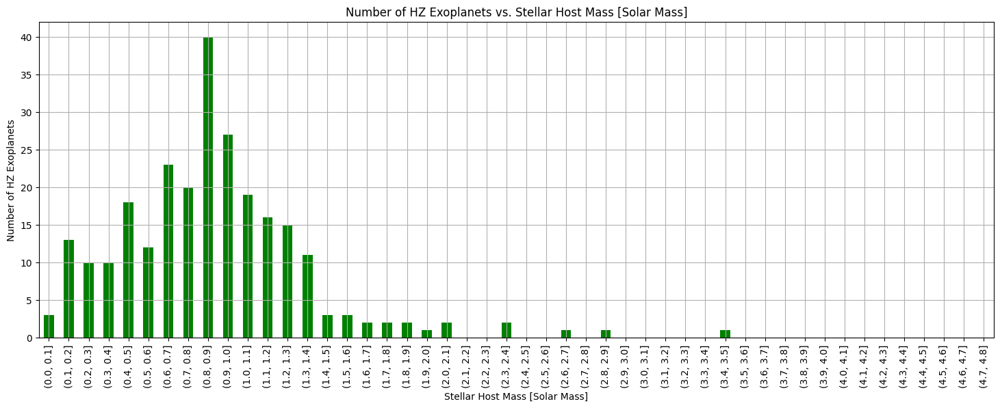

In [300]:
hz_exoplanets_data = exoplanets_data_with_host_star_ages.loc[(exoplanets_data_with_host_star_ages['pl_hz_status'] == 'In HZ')]
stellar_with_hz_exoplanet_mass_dist = pd.cut(hz_exoplanets_data['st_mass'], bins=stellar_mass_buckets)
stellar_with_hz_exoplanet_mass_dist.value_counts().sort_index().plot(kind='bar',
                                                                     figsize=(18, 6),
                                                                     xlabel='Stellar Host Mass [Solar Mass]',
                                                                     ylabel='Number of HZ Exoplanets',
                                                                     title='Number of HZ Exoplanets vs. Stellar Host Mass [Solar Mass]',
                                                                     color='green',
                                                                     grid=True)
stellar_with_hz_exoplanet_mass_dist.value_counts().sort_index()